In [11]:
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import glob
import time
import copy
import random
from matplotlib.colors import LogNorm
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Table, join, MaskedColumn
from astropy.nddata import NDData
from astropy.visualization import simple_norm
from astropy.modeling.fitting import LevMarLSQFitter
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy import wcs
from astropy.coordinates import SkyCoord
from astropy.coordinates import match_coordinates_sky
from astropy.time import Time
from photutils import DAOStarFinder
from photutils import CircularAperture, CircularAnnulus, RectangularAperture
from photutils import aperture_photometry
from photutils.psf import IterativelySubtractedPSFPhotometry as ISPSF
from photutils.psf import extract_stars
from photutils.psf.groupstars import DAOGroup
from photutils import EPSFBuilder
from photutils.background import MMMBackground
from photutils.utils import make_random_cmap
import astroalign as aa
import pickle

import jakeGloess as jg
from scipy.stats import iqr
import seaborn as sns
from scipy.signal import lombscargle
from scipy.optimize import curve_fit
from astropy.io.votable import parse, parse_single_table
import os.path
from astroquery.irsa_dust import IrsaDust

### Functions:

In [2]:
# could add a check to see if apertures need to be plotted (in case i want to plot just the fits)
def plotting(region, ap, an, cmap, choice, savename):
    plt.imshow(region, cmap=cmap, origin='lower', norm=LogNorm(), interpolation='nearest')
    
    if choice == 'ap_only':
        ap.plot(color='blue', lw=.5, alpha=1.)
    elif choice == 'both_aps':
        ap.plot(color='blue', lw=.5, alpha=.5)
        an.plot(color='red', lw=.5, alpha=.5)
        
    plt.colorbar(fraction = 0.05)
    #plt.grid(True)
    plt.minorticks_on()
    plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
    plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
    
    if savename != None:
        plt.savefig('images/IC4499/'+savename, dpi=500)
    
    plt.gcf().set_size_inches(10, 6)
    plt.show()
    #plt.close()
    
def print_table_nicely(table):   # note: 'table' must be an astropy Table type
    for col in table.colnames:
        table[col].info.format = '%.8g'
    print(table)
    
def star_find(data, sigma, fwhm, std, roundness, sharphi):
    daofind = DAOStarFinder(threshold=sigma*std, fwhm=fwhm, roundlo=-roundness, roundhi=roundness, sharphi=sharphi)
    sources = daofind(data)
    return sources
    
def ap_phot(data, ap, an, bkg_method):
    all_apers = [ap, an]
    table = aperture_photometry(data, all_apers)
    
    if bkg_method == 'mean':
        bkg_mean = table['aperture_sum_1'] / an.area
        table['bkg_sum_mean'] = bkg_mean * ap.area
        table['star_bkgsub'] = table['aperture_sum_0'] - table['bkg_sum_mean']
        
        an_err = bkg_mean * ap.area / np.sqrt(an.area)
        ap_err = bkg_mean * np.sqrt(ap.area)
        poisson_err = np.sqrt(table['star_bkgsub'])
        table['counts_err'] = np.sqrt(an_err**2 + ap_err**2 + poisson_err**2)
        #table['perc_err'] = table['counts_err'] / table['star_bkgsub']
    
    elif bkg_method == 'median':
        annulus_masks = an.to_mask(method='center')
        bkg_median = []
        for mask in annulus_masks:
            annulus_data = mask.multiply(data)
            annulus_data_1d = annulus_data[mask.data > 0]
            _, median_mask, _ = sigma_clipped_stats(annulus_data_1d)
            bkg_median.append(median_mask)
            
        bkg_median = np.array(bkg_median)
        table['bkg_sum_median'] = bkg_median * ap.area
        table['star_bkgsub'] = table['aperture_sum_0'] - table['bkg_sum_median']
        
        an_err = bkg_median * ap.area / np.sqrt(an.area)
        ap_err = bkg_median * np.sqrt(ap.area)
        poisson_err = np.sqrt(table['star_bkgsub'])
        table['counts_err'] = np.sqrt(an_err**2 + ap_err**2 + poisson_err**2)
        #table['perc_err'] = table['counts_err'] / table['star_bkgsub']
        
    else:
        print('\n\nPlease give a valid bkg_method kthx\n\n')
            
    return table

def apparent_magnitude_err(counts, apcorr, zmag_err, counts_err, apcorr_err):
    mag_err = np.sqrt(zmag_err**2 + (2.5 * np.sqrt((counts_err/counts)**2 + (apcorr_err/apcorr)**2) / np.log(10))**2)
    return mag_err

def make_catalog(x, y, header):
    crd = np.transpose((x, y))
    w = wcs.WCS(header)
    world = w.wcs_pix2world(crd, 0)
    ra = world[:,0]
    dec = world[:,1]
    cat = SkyCoord(ra, dec, frame='icrs', unit='deg')
    
    return cat, ra, dec

data/IC4499/IC4499/IC4499_4p5um.fits


No. of stars detected: 957
235.0 235.0
485.0 485.0


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


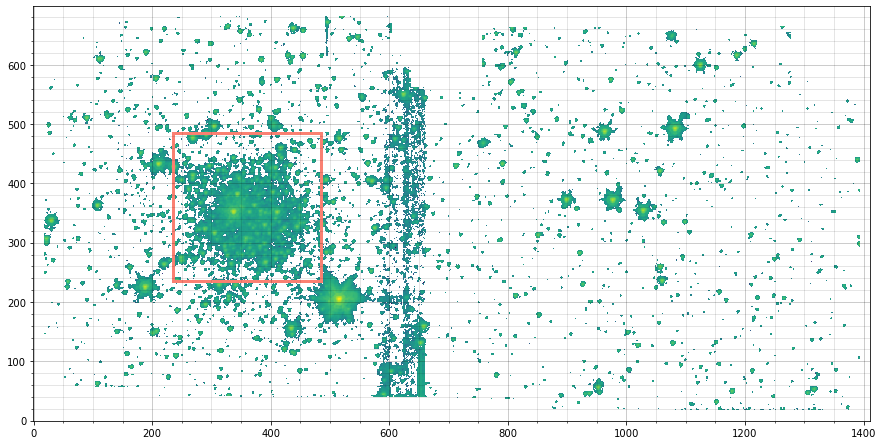

In [24]:
epsf_file = 'epsf_models/IC4499/epsf_'+channel+'_'+str(model_epoch)+'.pickle'
pickle_in = open(epsf_file, 'rb')
epsf = pickle.load(pickle_in)

file_m = base_dir+'IC4499/IC4499_'+channel+'.fits'
with fits.open(file_m) as hdu_list:        
    print(file_m)
    image_m = hdu_list[0].data
    hdr_m = hdu_list[0].header
    exptime = hdr_m['EXPTIME']
    if channel == '4p5um':
        fluxconv = 0.1469  # taken from epoch (all the same), missing in master header for some reason
    else:
        fluxconv = hdr_m['FLUXCONV']
    conv = exptime / fluxconv
    data_m = image_m * conv

mean_m, median_m, std_m = sigma_clipped_stats(data_m, sigma=sigma_level)

sources_m = star_find(data_m, sigma_level, FWHM, std_m, roundness, sharphi)
pos_m = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
apertures_m = CircularAperture(pos_m, r_ap)
annuli_m = CircularAnnulus(pos_m, r_in, r_out)
print('No. of stars detected: {}'.format(len(sources_m)))

if channel == '3p6um':
    rectloc = [1050, 340]
if channel == '4p5um':
    rectloc = [360, 360]
rectsize = 250
rect = RectangularAperture(np.transpose(rectloc), rectsize, rectsize)

limx_lo = rectloc[0] - 0.5*rectsize
limx_hi = rectloc[0] + 0.5*rectsize
limy_lo = rectloc[1] - 0.5*rectsize
limy_hi = rectloc[1] + 0.5*rectsize

print(limx_lo, limy_lo)
print(limx_hi, limy_hi)

plt.imshow(data_m, cmap='viridis', origin='lower', norm=LogNorm(), interpolation='nearest')
rect.plot(color='salmon', lw=3)
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gcf().set_size_inches(15, 9)
plt.show()

### Initial conditions:

In [21]:
run_all = True  # set to False to run only the first epoch
base_dir = 'data/IC4499/'
#channel = '3p6um'
channel = '4p5um'
#method = 'aperture'
method = 'PSF'
model_epoch = 'master'  # ePSF model epoch to use (loads from file now for ease)

sigma_level = 6.
sigma_level_PSF = 50.

FWHM = 5.
r_ap = 6.
r_in = 6.
r_out = 14.
roundness = 0.5
#sharphi = 0.9
sharphi = 1.
sharphi_model = 0.7
#sharplo = 0.65

if channel == '3p6um':
    zmag       = 18.80           # given in/calculated using IRAC handbook, section 4.8
    zmag_err   =  0.02           # calculated from zmag = 2.5log10(F0/C), F0 = 280.9 +/- 4.1 (from IRAC, table 4.1)
    apcorr     =  1.1233         # aperture correction for 6, 6-14 pix apertures in channel 1; given on IRAC website
    apcorr_err =  apcorr * 0.02  # taking accuracy to be ~2%, as mentioned in IRAC, section 4.10
elif channel == '4p5um':
    zmag       = 18.32
    zmag_err   =  0.02
    apcorr     =  1.1336
    apcorr_err =  apcorr * 0.02
else:
    print('Please select a valid channel')

### Building an ePSF from one image:

File to build ePSF model from: data/IC4499/IC4499/IC4499_4p5um.fits


    x         y      id
--------- --------- ---
780.78693 76.631607   0
603.70566 83.391498   1
449.33743  84.17103   2
165.24213 90.792547   3
240.33237 109.70743   4
158.33973  113.1655   5
316.26936 118.10752   6
423.26778 120.60721   7
1020.0985 127.22712   8
1078.7947 130.87029   9
      ...       ... ...
974.09986 574.58618 147
206.74837 576.85536 148
1152.0664  594.6284 149
433.88936 604.91041 150
384.39923 608.33069 151
111.06309 609.68137 152
454.69761 614.69611 153
429.33505 615.59837 154
1186.6935 615.65193 155
189.80465 620.41569 156
814.32966 620.26592 157
Length = 158 rows
Number of model stars: 158


C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


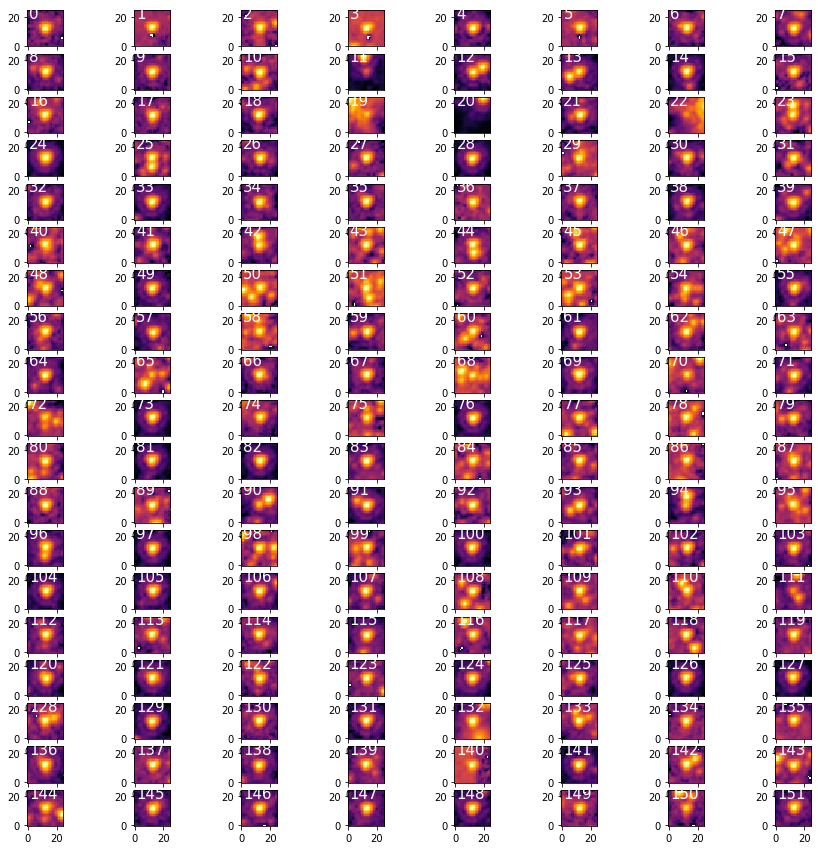

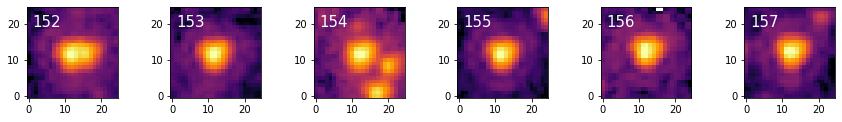

C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


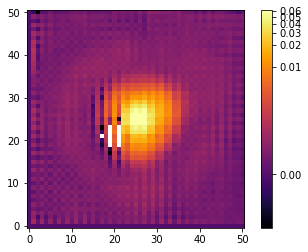

Input bad stars to remove them from the model (type -1 to exit simulation and save model):
1 2 3 5 7 8 10 11 12 13 14 19 20 22 23 25 27 29 31 36 39 40 41 42 43 44 45 46 47 48 50 51 52 53 54 56 58 59 60 62 63 64 65 66 68 70 72 74 75 77 78 79 80 84 85 86 87 89 90 91 92 93 94 95 96 98 99 101 102 106 107 108 109 110 111 112 113 115 116 117 118 122 123 125 128 132 133 134 139 140 142 143 144 149 150 152 154
[1, 2, 3, 5, 7, 8, 10, 11, 12, 13, 14, 19, 20, 22, 23, 25, 27, 29, 31, 36, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 56, 58, 59, 60, 62, 63, 64, 65, 66, 68, 70, 72, 74, 75, 77, 78, 79, 80, 84, 85, 86, 87, 89, 90, 91, 92, 93, 94, 95, 96, 98, 99, 101, 102, 106, 107, 108, 109, 110, 111, 112, 113, 115, 116, 117, 118, 122, 123, 125, 128, 132, 133, 134, 139, 140, 142, 143, 144, 149, 150, 152, 154]
    x         y      id
--------- --------- ---
780.78693 76.631607   0
240.33237 109.70743   4
316.26936 118.10752   6
1078.7947 130.87029   9
567.03487 161.03902  15
279.65595 169

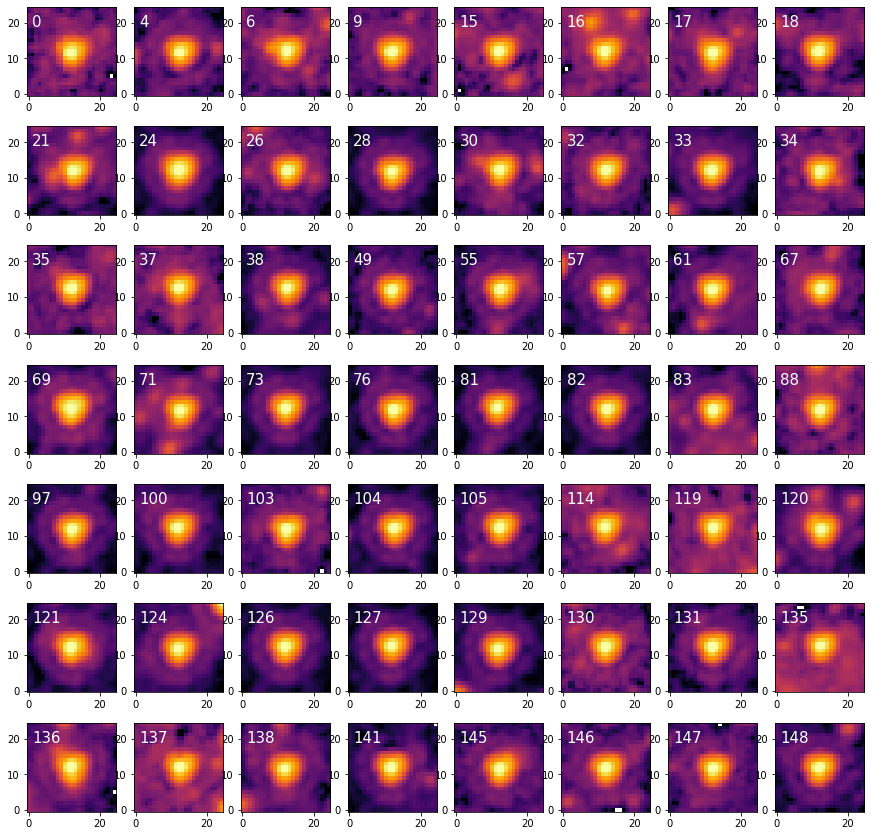

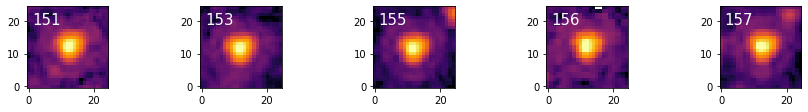

C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


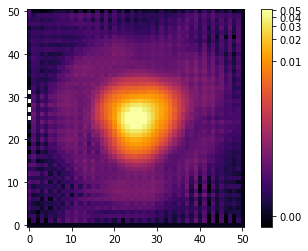

Input bad stars to remove them from the model (type -1 to exit simulation and save model):
16
[16]
    x         y      id
--------- --------- ---
780.78693 76.631607   0
240.33237 109.70743   4
316.26936 118.10752   6
1078.7947 130.87029   9
567.03487 161.03902  15
853.05785 178.50462  17
242.56568 186.02742  18
290.44228 195.83978  21
516.06211  205.1284  24
813.44103 210.82385  26
      ...       ... ...
380.63813 524.54652 138
624.53163 549.90331 141
805.33256 570.55277 145
411.02553 574.76216 146
974.09986 574.58618 147
206.74837 576.85536 148
384.39923 608.33069 151
454.69761 614.69611 153
1186.6935 615.65193 155
189.80465 620.41569 156
814.32966 620.26592 157
Length = 60 rows
Number of model stars: 60


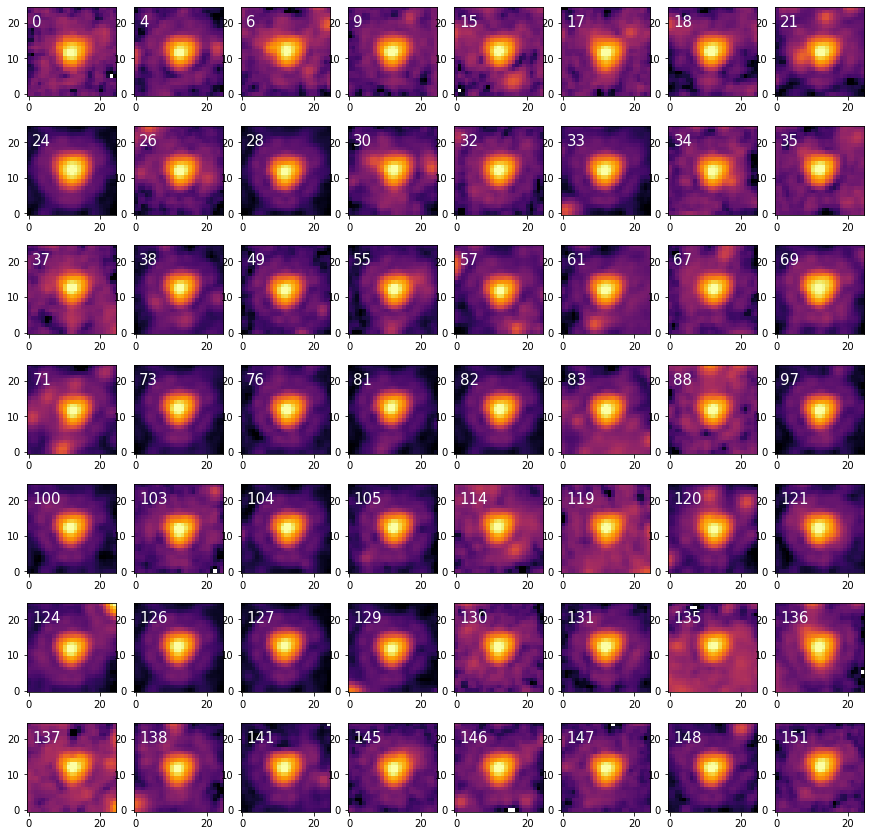

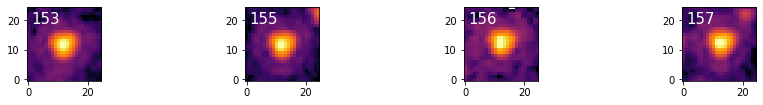

C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


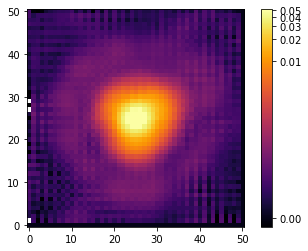

Input bad stars to remove them from the model (type -1 to exit simulation and save model):
-1
[-1]
Congrats Phil Collins, you escaped


In [8]:
###   BUILDING AN EPSF MODEL FROM ONE IMAGE   ###    

which_epoch = 'master'   # set to 'master' to build model from medianed image

if which_epoch == 'master':
    file_model = base_dir+'IC4499/'+'IC4499_'+channel+'.fits'
else:
    file_model = base_dir+'IC4499__e'+str(which_epoch)+'/IC4499__e'+str(which_epoch)+'_'+channel+'.fits'

print('File to build ePSF model from: {}'.format(file_model))
with fits.open(file_model) as hdu_list:
    data_model = hdu_list[0].data
    hdr_model = hdu_list[0].header
    if channel == '4p5um':
        fluxconv_model = 0.1469  # taken from epoch (all the same), missing in master header for some reason
    else:
        fluxconv_model = hdr_model['FLUXCONV']
    data_model *= hdr_model['EXPTIME'] / fluxconv_model

###   LOCATING STARS FOR PSF MODEL AND PLOTTING THEM   ###

mean, median, std = sigma_clipped_stats(data_model, sigma=sigma_level)

sources_model = star_find(data_model, sigma_level_PSF, FWHM, std, roundness, sharphi_model)
pos_model = np.transpose((sources_model['xcentroid'], sources_model['ycentroid']))
ap_model = CircularAperture(pos_model, r_ap)
an_model = CircularAnnulus(pos_model, r_in, r_out)
#print('No. of stars detected to build model from: {0}'.format(len(sources_model)))
#plotting(data_model, ap_model, an_model, 'Greys', choice='both_aps', savename=None)

###   DOING APERTURE PHOTOMETRY ON MODEL STARS   ###

phot_table = ap_phot(data_model, ap_model, an_model, 'median')
#print_table_nicely(phot_table)

cutout_size = 150
hsize = (cutout_size - 1) / 2
x_model = phot_table['xcenter'].value
y_model = phot_table['ycenter'].value
mask = ((x_model > hsize) & (x_model < (data_model.shape[1] - 1 - hsize)) &
        (y_model > hsize) & (y_model < (data_model.shape[0] - 1 - hsize)))
model_table = Table()
model_table['x'] = x_model[mask]
model_table['y'] = y_model[mask]

# Just numberin' the stars, don't mind me
model_table['id'] = np.array(range(len(model_table)))
print_table_nicely(model_table)

pos_model = np.transpose((model_table['x'], model_table['y']))
ap_model = CircularAperture(pos_model, r_ap)
#plotting(data_model, ap_model, an=None, cmap='Greys', choice='ap_only', savename=None)

while True:
    
    ###   BUILDING AN EPSF   ###

    nddata = NDData(data = data_model - median)
    model_stars = extract_stars(nddata, model_table, size=25)
    print('Number of model stars: {}'.format(len(model_stars)))
    figsize = 15
    ncols = 8
    nrows = int(np.floor(len(model_stars) / ncols))
    nremainder = len(model_stars) - (nrows*ncols)
    
    # Show images of most of the stars in a nice grid:
    fig, ax = plt.subplots(nrows, ncols, figsize=(figsize,figsize), squeeze=True)
    ax = ax.ravel()        
    for i in range(nrows*ncols):
        norm = simple_norm(model_stars[i], 'log', percent=99.)
        ax[i].imshow(model_stars[i], norm=norm, origin='lower', cmap='inferno', interpolation='nearest')
        #ax[i].set_title(model_table['id'][i])
        ax[i].text(1, 19, model_table['id'][i], color='w', size=15)
    plt.show()
    
    # Show images of the remaining stars that don't fit in the grid:
    fig, ax = plt.subplots(nrows=1, ncols=nremainder, figsize=(figsize,figsize/(figsize-nremainder)), squeeze=False)
    ax = ax.ravel()
    for i in range(nrows*ncols, len(model_stars)):
        norm = simple_norm(model_stars[i], 'log', percent=99.)
        ax[i-nrows*ncols].imshow(model_stars[i], norm=norm, origin='lower', cmap='inferno', interpolation='nearest')
        #ax[i-nrows*ncols].set_title(model_table['id'][i])
        ax[i-nrows*ncols].text(1, 19, model_table['id'][i], color='w', size=15)
    plt.show()

    epsf_builder = EPSFBuilder(oversampling=2, maxiters=10, progress_bar=True)
    epsf, fitted_stars = epsf_builder(model_stars)
    norm = simple_norm(epsf.data, 'log', percent=99.)
    plt.imshow(epsf.data, norm=norm, origin='lower', cmap='inferno')
    plt.colorbar()
    plt.show()

    print('Input bad stars to remove them from the model (type -1 to exit simulation and save model):')
    adios = [int(x) for x in input().split()]
    print(adios)

    if adios == [-1]:
        print('Congrats Phil Collins, you escaped')
        
        save_name = 'epsf_models/IC4499/epsf_'+channel+'_'+str(which_epoch)+'.pickle'
        pickle_out = open(save_name, 'wb')
        pickle.dump(epsf, pickle_out)
        pickle_out.close()
        
        break

    #model_table.remove_rows(adios)
    
    # Remove bad stars from the table:
    model_table.add_index('id')
    byebye = model_table.loc_indices[adios]
    model_table.remove_rows(byebye)

    print_table_nicely(model_table)

### Generating master source list:

data/IC4499/IC4499/IC4499_3p6um.fits


No. of stars detected: 947


C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


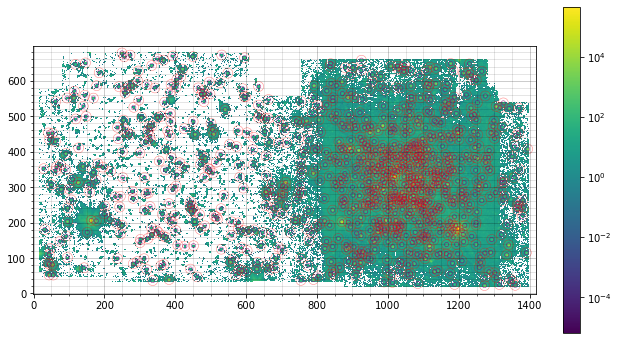

 id    x_0       y_0    sharpness  ...    peak      flux       mag      group_id
--- --------- --------- ---------- ... --------- --------- ------------ --------
  1 1272.5417 22.106715 0.69574384 ... 3778.3657  40.57773   -4.0207194        1
  2 1359.1897 22.760167 0.60492449 ... 119.02748 1.1981697  -0.19629579        2
  8 1351.7543 33.683628 0.59076454 ... 149.34607 1.7019651  -0.57737662        2
 13 1345.1691 40.393969 0.66404748 ... 142.26953 1.5207885  -0.45517206        2
  3  1188.065 25.209387  0.6902382 ... 249.82341 2.5615184   -1.0212437        3
  4  1314.196  25.15199 0.62751991 ...  105.9648 1.1259054  -0.12875477        4
  5 1084.4276  27.77116 0.64279805 ... 120.58943 1.2506453  -0.24283538        5
  6 1012.5585 30.898469  0.5604667 ... 88.160957 1.0367058 -0.039138769        6
  7 989.23222 32.041558 0.65816238 ... 116.90565 1.1654539  -0.16623779        7
  9 336.39041 36.158519 0.65928377 ... 257.91382 2.5628395   -1.0218035        8
...       ...       ...     

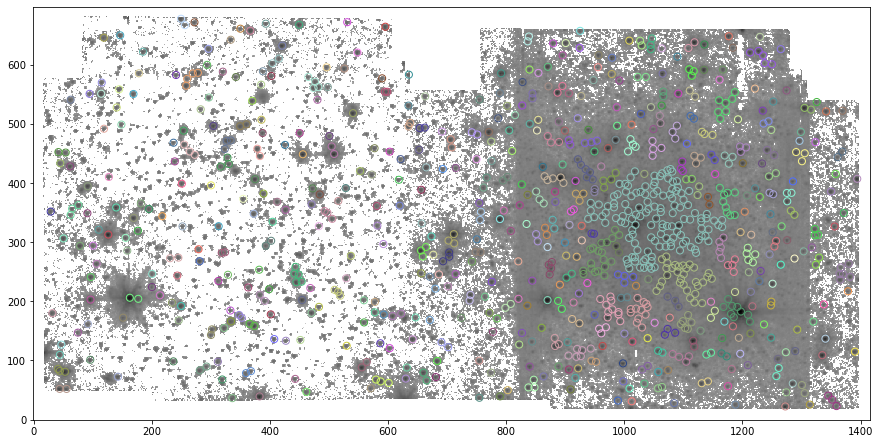

Time taken to fit PSF model: 92.72068539999987s
   x_0       y_0      flux_0    id ... id_master     RA       dec    
--------- --------- ---------- --- ... --------- --------- ----------
1272.5417 22.106715  47115.745   1 ...         0  225.0713 -82.276328
1359.1897 22.760167  2945.6048   2 ...         1 224.98469 -82.284886
1351.7543 33.683628  2735.9769   8 ...         2 224.98398 -82.282686
1345.1691 40.393969  2804.3817  13 ...         3 224.98555 -82.281133
 1188.065 25.209387  4524.5009   3 ...         4 225.15277  -82.26747
 1314.196  25.15199  2150.7104   4 ...         5 225.02766  -82.28008
1084.4276  27.77116  2511.6391   5 ...         6  225.2534 -82.256747
1012.5585 30.898469  1924.1994   6 ...         7 225.32201 -82.249117
989.23222 32.041558  2745.3532   7 ...         8 225.34415 -82.246621
336.39041 36.158519  5075.9178   9 ...         9 225.97909 -82.179988
      ...       ...        ... ... ...       ...       ...        ...
1093.1985 498.93921  9145.6006  79 ...    

In [15]:
epsf_file = 'epsf_models/IC4499/epsf_'+channel+'_'+str(model_epoch)+'.pickle'
pickle_in = open(epsf_file, 'rb')
epsf = pickle.load(pickle_in)

file_m = base_dir+'IC4499/IC4499_'+channel+'.fits'
with fits.open(file_m) as hdu_list:        
    print(file_m)
    image_m = hdu_list[0].data
    hdr_m = hdu_list[0].header
    exptime = hdr_m['EXPTIME']
    if channel == '4p5um':
        fluxconv = 0.1469  # taken from epoch (all the same), missing in master header for some reason
    else:
        fluxconv = hdr_m['FLUXCONV']
    conv = exptime / fluxconv
    data_m = image_m * conv

mean_m, median_m, std_m = sigma_clipped_stats(data_m, sigma=sigma_level)

sources_m = star_find(data_m, sigma_level, FWHM, std_m, roundness, sharphi)
pos_m = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
apertures_m = CircularAperture(pos_m, r_ap)
annuli_m = CircularAnnulus(pos_m, r_in, r_out)
print('No. of stars detected: {}'.format(len(sources_m)))
plotting(data_m, apertures_m, annuli_m, 'viridis', choice='both_aps', savename=None)

###   MASKING CHANNEL 2 TO IGNORE BRIGHT SPLODGE   ###

if channel == '4p5um':
    x_mask = sources_m['xcentroid']
    y_mask = sources_m['ycentroid']
    del sources_m
    xlim = 1150
    mask_m = (x_mask < xlim)
    sources_m = Table()
    sources_m['xcentroid'] = x_mask[mask_m]
    sources_m['ycentroid'] = y_mask[mask_m]

    pos_mask = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
    ap_mask = CircularAperture(pos_mask, r_ap)
    plotting(data_m, ap_mask, an=None, cmap='Greys', choice='ap_only', savename=None)

###   ###

sources_m['xcentroid'].name = 'x_0'
sources_m['ycentroid'].name = 'y_0'
#daogroup = DAOGroup(crit_separation=2.5*FWHM)
daogroup = DAOGroup(crit_separation=3.*FWHM)
star_groups = daogroup(sources_m)
star_groups = star_groups.group_by('group_id')
print_table_nicely(star_groups)

ncolors = max(star_groups['group_id'])
cmap = make_random_cmap(ncolors=ncolors, seed=1612)
plt.imshow(data_m, origin='lower', norm=LogNorm(), interpolation='nearest', cmap='Greys')
for i, group in enumerate(star_groups.groups):
    pos_group = np.transpose([group['x_0'], group['y_0']])
    ap_group = CircularAperture(pos_group, r_ap)
    ap_group.plot(color=cmap.colors[i], lw=1.)
plt.gcf().set_size_inches(15, 9)
plt.show()

data_m_nonans = np.nan_to_num(data_m, nan=0.00001, copy=True) # changing NaN values to a float so PSF fit doesn't crash

#bkg_estimation = MMMBackground()
#fitter = LevMarLSQFitter()
daofind_PSF = DAOStarFinder(threshold=sigma_level*std_m, fwhm=FWHM, roundlo=-roundness, roundhi=roundness, sharphi=0.85)
fit_rad = 5

epsf.x_0.fixed = True
epsf.y_0.fixed = True
init_pos_m = Table(names=['x_0', 'y_0'], data=[sources_m['x_0'], sources_m['y_0']])
#init_pos_m = Table(names=['x_0', 'y_0'], data=transf_list)

start = time.perf_counter()
PSF_photometry = ISPSF(finder = daofind_PSF,
                      group_maker = daogroup,
                      bkg_estimator = MMMBackground(),
                      psf_model = epsf,
                      fitter = LevMarLSQFitter(),
                      fitshape = 2*fit_rad+1,
                      niters = 2,
                      aperture_radius = 6.)
master_stars = PSF_photometry(image=data_m_nonans, init_guesses=init_pos_m)
residual_image_m = PSF_photometry.get_residual_image()
print('Time taken to fit PSF model: {}s'.format(time.perf_counter() - start))

master_stars['id_master'] = np.arange(len(master_stars))

cat_m, ra_m, dec_m = make_catalog(master_stars['x_0'], master_stars['y_0'], hdr_m)
master_stars['RA'] = ra_m
master_stars['dec'] = dec_m

print_table_nicely(master_stars)
master_stars.write('outputs/IC4499/table_'+channel+'_master''.txt', format='csv', overwrite=True)

#### Old version of master list (source detection only, no PSF):

In [ ]:
file_m = base_dir+'IC4499/IC4499_'+channel+'.fits'
with fits.open(file_m) as hdu_list:        
    print(file_m)
    image_m = hdu_list[0].data
    hdr_m = hdu_list[0].header
    exptime = hdr_m['EXPTIME']
    fluxconv = hdr_m['FLUXCONV']
    conv = exptime / fluxconv
    data_m = image_m * conv

mean_m, median_m, std_m = sigma_clipped_stats(data_m, sigma=sigma_level)

sources_m = star_find(data_m, sigma_level, FWHM, std_m, roundness, sharphi)
pos_m = np.transpose((sources_m['xcentroid'], sources_m['ycentroid']))
apertures_m = CircularAperture(pos_m, r_ap)
annuli_m = CircularAnnulus(pos_m, r_in, r_out)
print('No. of stars detected: {}'.format(len(sources_m)))
plotting(data_m, apertures_m, annuli_m, 'Greys', choice='both_aps', savename=None)

sources_m['id'] -= 1
sources_m['id'].name = 'id_master'

cat_m, ra_m, dec_m = make_catalog(sources_m['xcentroid'], sources_m['ycentroid'], hdr_m)
sources_m['RA'] = ra_m
sources_m['dec'] = dec_m

print(sources_m)
#sources_m.write('outputs/IC4499/table_'+channel+'_master''.txt', format='csv', overwrite=True)
sources_m['xcentroid', 'ycentroid', 'RA', 'dec'].write('outputs/IC4499/master_list_test.txt', format='csv', overwrite=True)

### Main photometry code:

Photometry method selected: PSF


C:\Users\Jake\anaconda3\lib\site-packages\astropy\visualization\stretch.py:285: RuntimeWarning: invalid value encountered in log
  np.log(values, out=values)


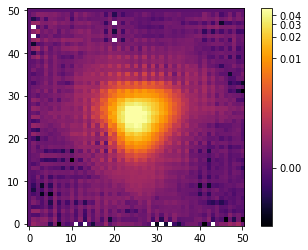

data/PAL13\PAL13__e1\PAL13__e1_3p6um.fits
EXPTIME: 71.6409606934
FLUXCONV: 0.1253


Mean: 46.72765350341797
Median: 45.730224609375
Std dev: 14.764931678771973
Number of PSF stars: 661
 id    x_0       y_0    sharpness  ...    peak      flux       mag     group_id
--- --------- --------- ---------- ... --------- --------- ----------- --------
  1 948.75337 24.167682  0.6569888 ...  148.1198  1.530627 -0.46217344        1
  2 1030.0933 24.548322 0.73889022 ... 727.48651 9.4235367  -2.4355348        2
  3 1152.7091 25.117738 0.55726339 ... 113.95512   1.23312 -0.22751337        3
  4 1272.2572 25.339831 0.33643001 ... 116.63039 1.1644854 -0.16533514        4
  5 1251.9191 31.510336 0.52182439 ... 143.66876 1.7216353 -0.58985287        5
  6 1305.6097 37.173579 0.55747946 ... 131.96597   1.55092 -0.47647346        6
  7 320.75171 38.885568 0.72912555 ... 276.06454 3.1189919  -1.2350356        7
  8 1341.7396 42.559112 0.55697382 ...  115.9473 1.1160308 -0.11919048        8
  9 662.42293 42.694599 0.69536197 ...  228.2364 2.7868453  -1.1127822        9
 10 1160.7337 47.29

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


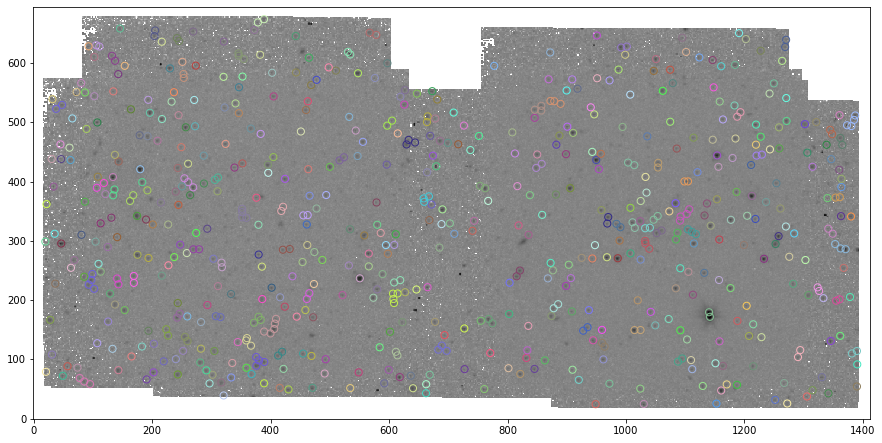

Time taken to fit PSF model: 14.26376190000019s


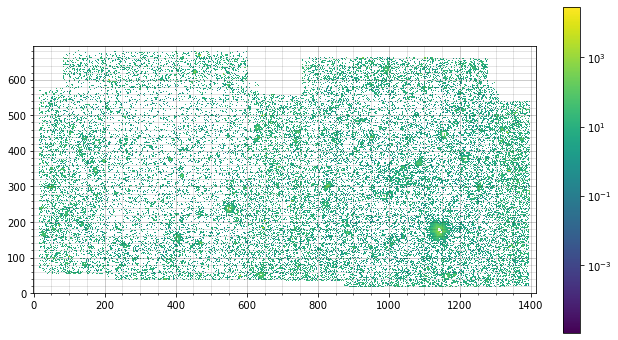

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 948.75337 24.167682 346.72416 12.805317    17.773514 0.084026703
  2 1030.0933 24.548322 346.72941 12.792763    15.754222 0.043403378
  3 1152.7091 25.117738 346.73732 12.773838    18.328259  0.10540509
  4 1272.2572 25.339831 346.74508 12.755408    17.692206 0.076848844
  5 1251.9191 31.510336 346.74278 12.758148    17.808359 0.084651292
  6 1305.6097 37.173579 346.74539 12.749517    17.978556  0.10612892
  7 320.75171 38.885568 346.68083 12.901116    16.838436 0.077813076
  8 1341.7396 42.559112 346.74689 12.743609    18.166167  0.11492321
  9 662.42293 42.694599 346.70254 12.848244    17.163658 0.066539749
 10 1160.7337 47.294202 346.73434 12.771191     13.91635 0.041505369
...       ...       ...       ...       ...          ...         ...
 73 773.05312 638.03981 346.61572 12.793295          nan         nan
 74 757.15377 640.13196 346.61435 

Number of PSF stars: 667
 id    x_0       y_0    sharpness  ...    peak      flux       mag      group_id
--- --------- --------- ---------- ... --------- --------- ------------ --------
  1 1022.0038 21.286805 0.29241199 ... 105.25203  1.174657   -0.1747777        1
  3  1028.894 24.717204 0.82110459 ...  767.3186 9.2521918   -2.4156116        1
  2 947.77639 24.888598 0.54695665 ... 140.16597 1.5239801  -0.45744827        2
  4 1251.2161 32.136696 0.36437963 ...  95.06469 1.0446786 -0.047456719        3
  5 1332.8141 34.172671 0.60442669 ... 107.62125 1.0572245 -0.060418005        4
  6 285.97314 39.793092 0.46105673 ... 165.34047 1.8809665  -0.68595263        5
  7 577.45878 41.655558 0.54185035 ... 109.33105 1.3605449  -0.33428216        6
  8 530.41333 43.602789 0.57379173 ... 95.156281  1.013648 -0.014717965        7
 15 532.65522 51.466776 0.58669591 ...  111.5334 1.1009636  -0.10443244        7
  9 1159.6134 47.465796 0.47248108 ...  2802.562 48.502578   -4.2144121        8
...

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


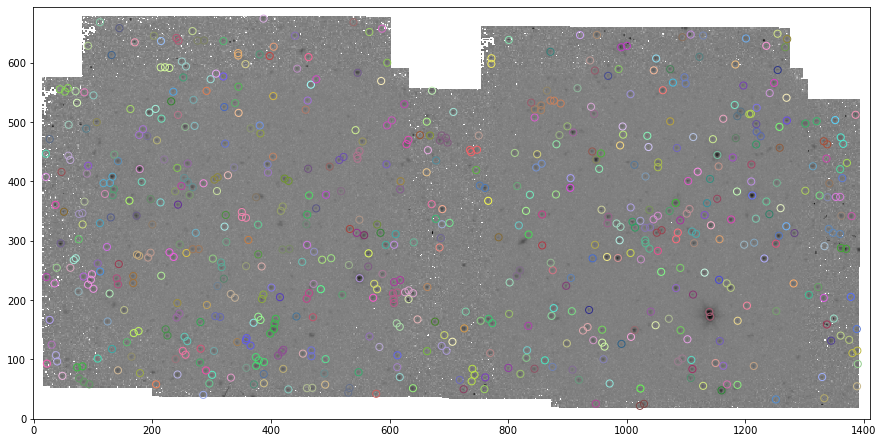

Time taken to fit PSF model: 14.277282399999876s


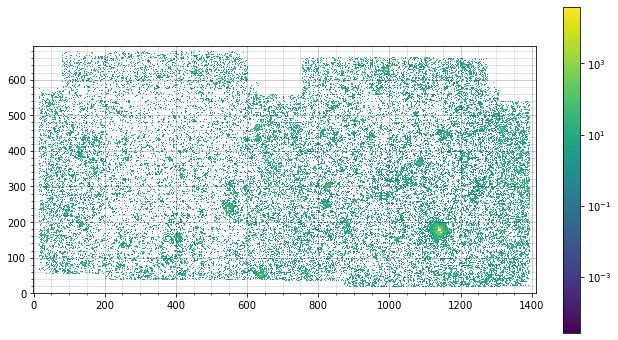

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1022.0038 21.286805 346.72947 12.794053    18.002199  0.22123961
  3  1028.894 24.717204 346.72938 12.792773    15.796931  0.04151602
  2 947.77639 24.888598 346.72406 12.805256    17.692035 0.068954935
  4 1251.2161 32.136696 346.74273 12.758058    18.457609  0.14134684
  5 1332.8141 34.172671 346.74773  12.74536    18.616136   0.1473308
  6 285.97314 39.793092 346.67846 12.906234    17.403754  0.10122289
  7 577.45878 41.655558 346.69722 12.861223    18.645173  0.22478994
  8 530.41333 43.602789 346.69383 12.868345    19.187305  0.29162104
 15 532.65522 51.466776 346.69274 12.867498    18.491475  0.14995353
  9 1159.6134 47.465796 346.73433  12.77119    13.907292 0.042791703
...       ...       ...       ...       ...          ...         ...
 85 83.250059 649.32927  346.5689 12.898595    19.087142  0.68223102
 86 95.119216 650.38181 346.56951 

Number of PSF stars: 675
 id    x_0       y_0    sharpness  ...    peak      flux       mag      group_id
--- --------- --------- ---------- ... --------- --------- ------------ --------
  1 948.48415 25.330419 0.71107382 ... 141.57059 1.1899842  -0.18885298        1
  2 927.03637  25.98222 0.42642604 ... 102.61816 1.0258894 -0.027751357        2
  3 1057.9456  34.85218 0.79014012 ... 214.25883 2.5743295   -1.0266603        3
  4  1274.791  35.57868 0.79513527 ... 363.78134  4.220091   -1.5633045        4
 13 1279.2447 47.081551 0.67592424 ... 153.37845 1.4744381  -0.42156635        4
  5  286.6815 39.363989 0.56006924 ... 188.34114 2.0302096   -0.7688522        5
  6 320.94335 37.345459 0.81711564 ...  208.6302 1.5867135  -0.50124627        6
  7 428.59709 39.950724 0.34978478 ... 81.789001 1.0159928 -0.017226607        7
 14  430.4059 49.104117 0.66548044 ... 408.05402 4.8356548   -1.7111382        7
  8  1367.757 40.265422 0.78433955 ... 158.55853 1.4392282  -0.39532418        8
...

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


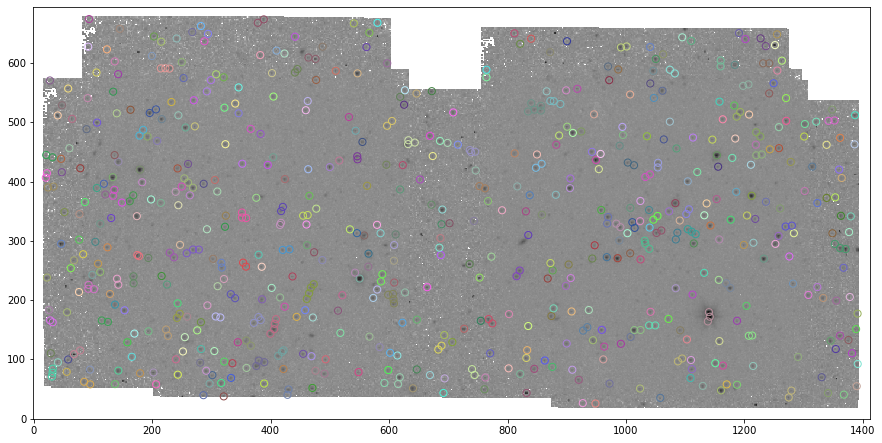

Time taken to fit PSF model: 14.832105500000125s


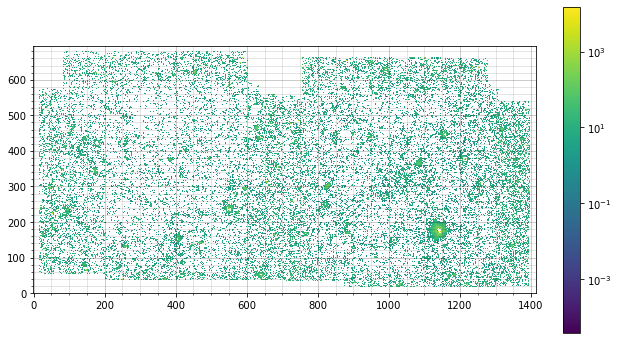

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 948.48415 25.330419 346.72397  12.80527    17.992307  0.08623327
  2 927.03637  25.98222 346.72246 12.808531    18.404106  0.13888862
  3 1057.9456  34.85218 346.72962 12.787806    17.876534  0.12975038
  4  1274.791  35.57868 346.74367 12.754364    16.749708 0.044165533
 13 1279.2447 47.081551 346.74215 12.752945    17.795345  0.09952163
  5  286.6815 39.363989 346.67847  12.90629    17.316371   0.1080882
  6 320.94335 37.345459 346.68103 12.901142    17.470046  0.19014386
  7 428.59709 39.950724 346.68766 12.884399    20.534826   1.9292125
 14  430.4059 49.104117 346.68634 12.883536     16.21473 0.046790808
  8  1367.757 40.265422 346.74901 12.739748    17.963469 0.095493273
...       ...       ...       ...       ...          ...         ...
 93  294.3378 649.43352 346.58261 12.866192    25.458984   135.34886
 94 602.33235 650.30823 346.60263 

Number of PSF stars: 661
 id    x_0       y_0    sharpness  ...    peak      flux       mag      group_id
--- --------- --------- ---------- ... --------- --------- ------------ --------
  1 948.84351 24.227044 0.43199646 ... 113.17474 1.3377361  -0.31592608        1
  2 1029.9666 24.828393 0.81382027 ... 691.17426 8.1308164   -2.2753354        2
  3 926.18931 26.057934  0.3985453 ... 98.007843 1.2725722  -0.26170611        3
  4 1271.6563 25.755058 0.44060766 ... 153.14928 1.9998641  -0.75250122        4
  5 1274.9064 35.809908 0.73654222 ... 328.02899 3.8422664   -1.4614687        4
  6 702.86393 40.653034 0.36755848 ... 106.56361  1.453308  -0.40589419        5
  7 662.58955 42.482233 0.74492754 ... 250.41148 2.7901708    -1.114077        6
  8 1341.4685 42.600994 0.75799782 ... 139.26503 1.3168195   -0.2988156        7
  9 868.63263 43.250163 0.80422559 ... 1694.2329 24.572771   -3.4761353        8
 10 1160.4242 47.597354 0.60174789 ... 3278.8865 49.813349   -4.2433643        9
...

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


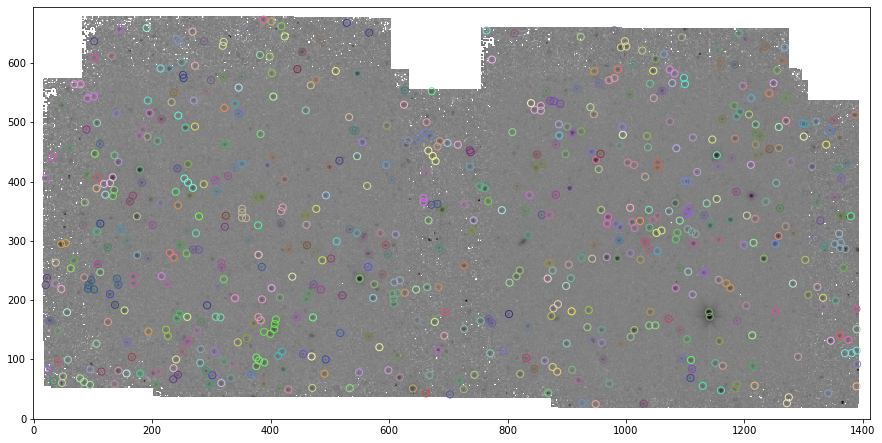

Time taken to fit PSF model: 14.488096000000041s


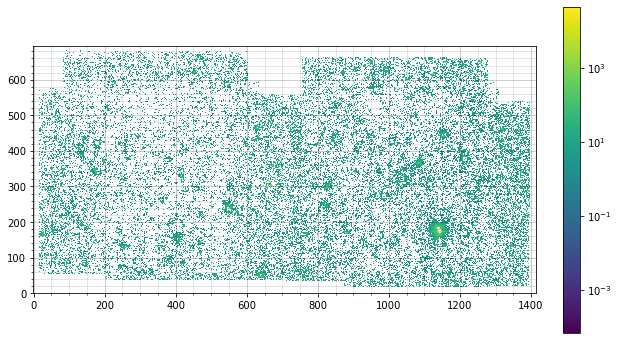

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 948.84351 24.227044 346.72417 12.805285    18.161456  0.10690646
  2 1029.9666 24.828393 346.72938 12.792755     15.87715 0.036833349
  3 926.18931 26.057934  346.7224 12.808656     18.48921  0.13032744
  4 1271.6563 25.755058 346.74504 12.755479    17.473228 0.074773818
  5 1274.9064 35.809908 346.74366 12.754337    16.760576 0.045653128
  6 702.86393 40.653034 346.70548 12.842113    18.170796  0.12578324
  7 662.58955 42.482233 346.70256 12.848198    17.112688 0.058713361
  8 1341.4685 42.600994 346.74694 12.743655    18.111219  0.11558239
  9 868.63263 43.250163 346.71592 12.816422    15.057509 0.065612115
 10 1160.4242 47.597354 346.73431 12.771214    13.848799 0.039090182
...       ...       ...       ...       ...          ...         ...
 86 93.633672 656.99396 346.56825 12.896567          nan         nan
 90 84.073453 658.98871 346.56731 

Number of PSF stars: 640
 id    x_0       y_0    sharpness  ...    flux        mag      group_id
--- --------- --------- ---------- ... --------- ------------- --------
  1 1170.5715 21.106122 0.70000692 ... 1.1049559   -0.10836241        1
  2 947.46105 24.346351 0.53026707 ... 1.1548283   -0.15629359        2
  3 1029.0569 24.711621 0.74263399 ... 8.2040043    -2.2850647        3
  4 1271.3104 26.006026 0.39484252 ...  1.679889   -0.56320147        4
  8 1273.9685 35.710888  0.7755942 ... 3.6935063    -1.4185971        4
 14 1278.9093 46.817497  0.4501081 ... 1.5052359   -0.44401139        4
  5 1251.0182 31.806236 0.46298268 ... 1.1402413   -0.14249195        5
  6 915.14598 33.432507 0.82579843 ... 1.2118854   -0.20865389        6
  7 1365.8898 34.253677 0.33903748 ... 1.0025624 -0.0027785666        7
  9 692.78148 39.389932  0.7816244 ... 1.9442593   -0.72188547        8
...       ...       ...        ... ...       ...           ...      ...
633 266.94385 652.67855 0.79618898 ... 

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


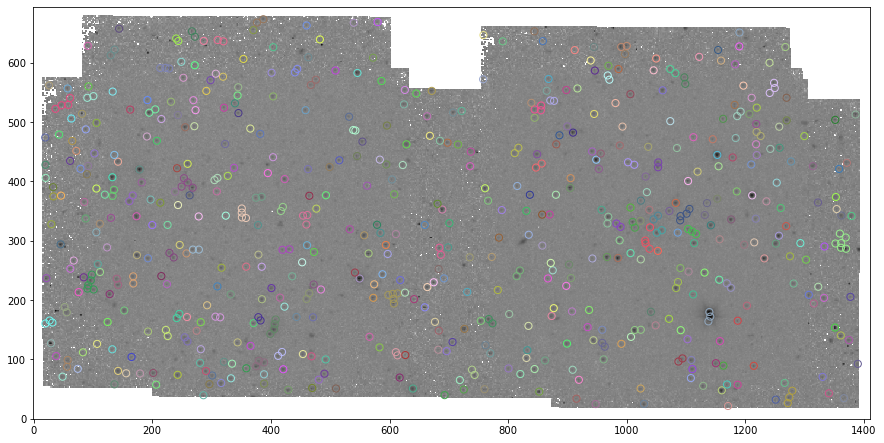

Time taken to fit PSF model: 14.375267599999916s


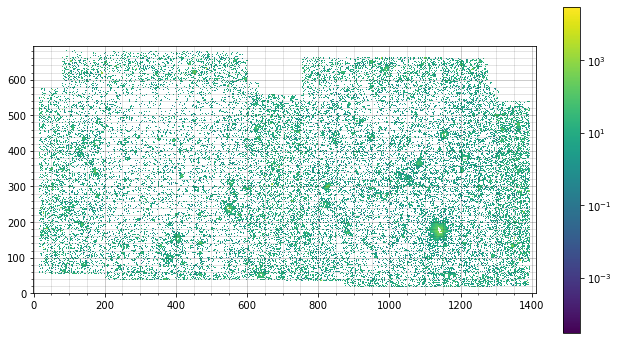

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1170.5715 21.106122  346.7392 12.771229    18.642987  0.31267037
  2 947.46105 24.346351 346.72408 12.805373     17.90928 0.083081046
  3 1029.0569 24.711621 346.72937 12.792787    15.840122  0.03965267
  4 1271.3104 26.006026 346.74502 12.755405    17.552398 0.080143282
  8 1273.9685 35.710888 346.74366 12.754377    16.748544 0.043571309
 14 1278.9093 46.817497 346.74223 12.752907    17.621448 0.078735677
  5 1251.0182 31.806236 346.74277  12.75816    18.398634  0.14945518
  6 915.14598 33.432507 346.72053 12.809768      18.4058  0.11446951
  7 1365.8898 34.253677  346.7499 12.740317    18.437611  0.15319439
  9 692.78148 39.389932 346.70503 12.843623    18.072371  0.18625439
...       ...       ...       ...       ...          ...         ...
105 83.527516 649.12607 346.56883  12.89846    21.261859   4.9934962
106 95.308968 650.84622 346.56933 

Number of PSF stars: 668
 id    x_0       y_0    sharpness  ...    flux        mag      group_id
--- --------- --------- ---------- ... --------- ------------- --------
  1  947.4638 24.114626  0.5423722 ... 1.7851845   -0.62920776        1
  2 1029.1433 24.697433 0.73762954 ... 8.4309574    -2.3146922        2
  3 1233.0657 31.186055 0.84819319 ... 19.486347    -3.2243261        3
  4 1183.9556 31.866132 0.33591593 ... 1.0571366  -0.060327735        4
  5 1250.8679 32.070755 0.34244973 ... 1.1415649   -0.14375153        5
  6 1374.8044 32.894882 0.43665132 ... 1.0586789  -0.061910608        6
  7 1273.9923 36.338756 0.59759848 ... 2.8801245    -1.1485282        7
  8 1305.0145 38.347388 0.33996965 ... 1.1339746   -0.13650832        8
  9 285.91106  39.18157 0.46002227 ...  1.937135   -0.71789972        9
 10 398.32087 38.982382  0.8270341 ... 2.3228775   -0.91506578       10
...       ...       ...        ... ...       ...           ...      ...
657  1253.456 648.99301 0.49618114 ... 

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


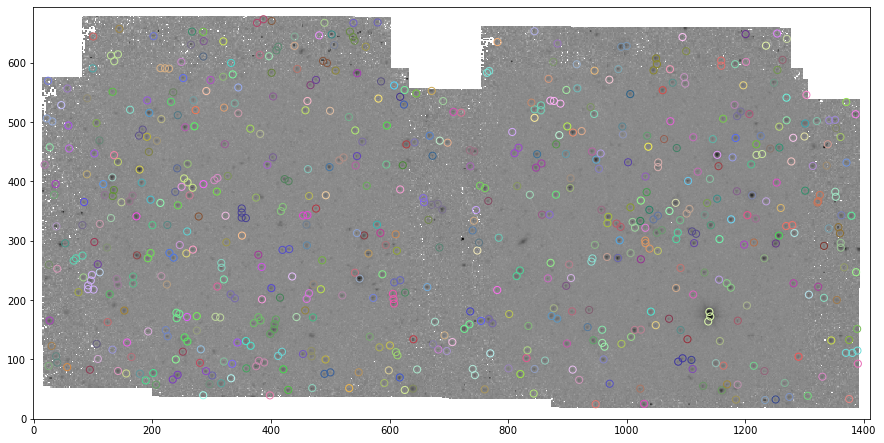

Time taken to fit PSF model: 14.34644389999994s


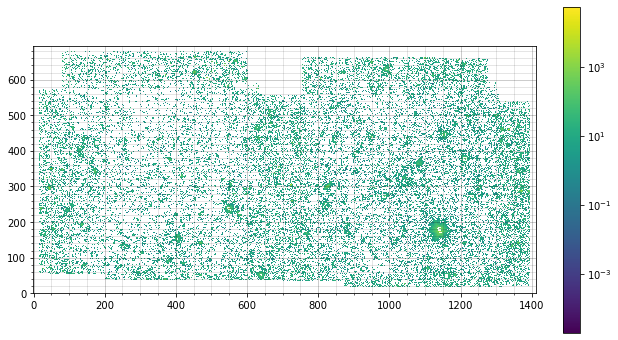

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1  947.4638 24.114626 346.72412 12.805391    17.929903  0.10107458
  2 1029.1433 24.697433 346.72938 12.792779    15.814421 0.041440745
  3 1233.0657 31.186055 346.74171 12.760971    15.381425 0.073027592
  4 1183.9556 31.866132 346.73839 12.768488    17.974124  0.07438102
  5 1250.8679 32.070755 346.74274 12.758174    18.179725 0.098721769
  6 1374.8044 32.894882 346.75072 12.739041    19.107003  0.21299814
  7 1273.9923 36.338756 346.74358 12.754341    16.802479 0.050428477
  8 1305.0145 38.347388 346.74529 12.749437    18.024985  0.10431727
  9 285.91106  39.18157  346.6784 12.906268    17.568691  0.13993958
 10 398.32087 38.982382  346.6858 12.888977    17.672517  0.19231942
...       ...       ...       ...       ...          ...         ...
 81 1200.9288 640.45364 346.64345 12.726993    17.202309 0.074323802
 82 481.33133 645.93113 346.59541 

Number of PSF stars: 643
 id    x_0       y_0    sharpness  ...    peak      flux       mag      group_id
--- --------- --------- ---------- ... --------- --------- ------------ --------
  1 1152.8124 25.550476  0.4343129 ... 99.866936 1.1138468  -0.11706364        1
  2 1272.2797 25.539162 0.40100069 ...  129.9579 1.3624607  -0.33580999        2
  5  1275.297 36.214091 0.61634607 ... 252.67496 3.0261749   -1.2022351        2
  3 1252.3018 31.898148 0.35157364 ... 111.65322 1.1415978  -0.14378278        3
  4 1334.1073 34.140882 0.54579091 ... 123.34531 1.2866951  -0.27368913        4
  6 803.63799 36.892019 0.66697381 ... 780.17584 12.293787   -2.7242142        5
  7 287.12995 39.092623 0.53961284 ... 168.89525 1.6091213  -0.51647198        6
  8 781.81089 40.429014 0.32092663 ... 104.00144 1.1761835  -0.17618771        7
  9 579.54037  42.13177 0.57403142 ... 117.84704 1.2396367  -0.23323607        8
 10 662.48853 42.208781 0.84424446 ... 333.85181  3.804271   -1.4506786        9
...

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


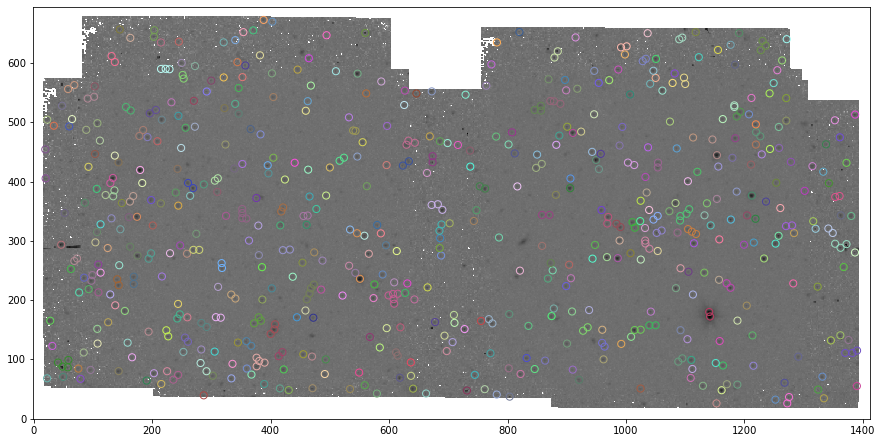

Time taken to fit PSF model: 14.11904770000001s


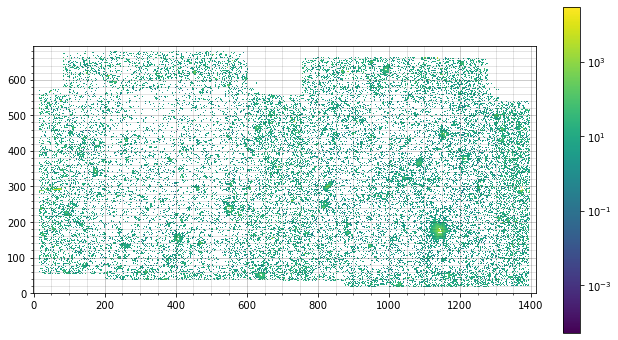

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1152.8124 25.550476 346.73728 12.773898    18.737962   0.2042863
  2 1272.2797 25.539162 346.74511 12.755509    17.768453 0.088203977
  5  1275.297 36.214091 346.74363 12.754362    16.933748 0.050063708
  3 1252.3018 31.898148  346.7428 12.758178    17.937639 0.091814516
  4 1334.1073 34.140882 346.74781 12.745442    18.319198  0.11865212
  6 803.63799 36.892019 346.71261 12.826921     15.59258 0.075298085
  7 287.12995 39.092623 346.67839 12.906282    17.380844  0.12107931
  8 781.81089 40.429014 346.71062 12.830055    18.283493  0.10687441
  9 579.54037  42.13177 346.69709  12.86108    18.486701  0.17643978
 10 662.48853 42.208781 346.70251 12.848307    16.908474 0.063175887
...       ...       ...       ...       ...          ...         ...
100 820.17298 652.40081 346.61654 12.785014          nan         nan
109 816.20082  658.7163 346.61528 

Number of PSF stars: 662
 id    x_0       y_0    sharpness  ...    flux        mag      group_id
--- --------- --------- ---------- ... --------- ------------- --------
  1 1022.7806 21.203254 0.60774359 ...  1.240567   -0.23405055        1
  5 1029.6681 24.980677 0.54345704 ... 6.8156834    -2.0837735        1
  2 1221.8437 22.230122 0.54511604 ... 1.1191574   -0.12222791        2
  3 1252.2121 21.132988 0.70887156 ... 1.2525702    -0.2445052        3
  9 1251.3962 32.455876  0.6087778 ...  1.252186   -0.24417213        3
 13 1258.7999 37.729768 0.59441272 ... 1.0319079  -0.034102383        3
  4 948.06848  24.88258 0.34196956 ... 1.2911163   -0.27741337        4
  6 1271.8272 26.267837 0.72558802 ... 1.5217718   -0.45587384        5
 12 1274.2285 36.188406 0.58931636 ... 3.1018603    -1.2290556        5
  7 925.24121 28.027488  0.6740185 ... 1.1253259   -0.12819577        6
...       ...       ...        ... ...       ...           ...      ...
652 1189.7948 650.84021 0.74025968 ... 

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


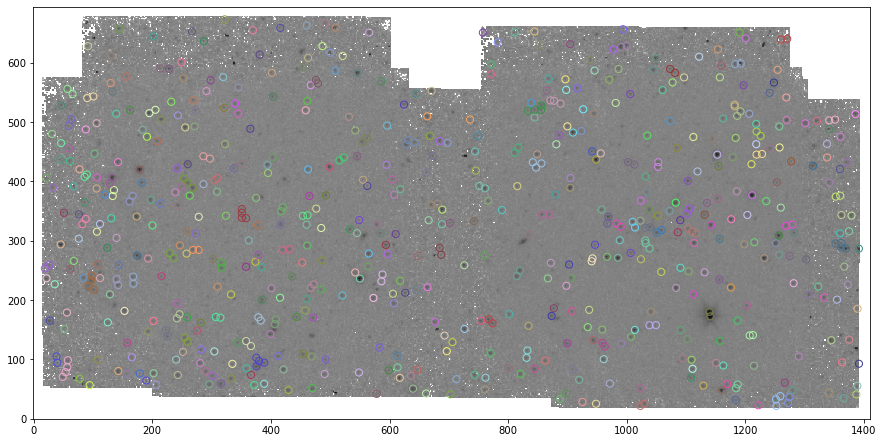

Time taken to fit PSF model: 14.543941500000074s


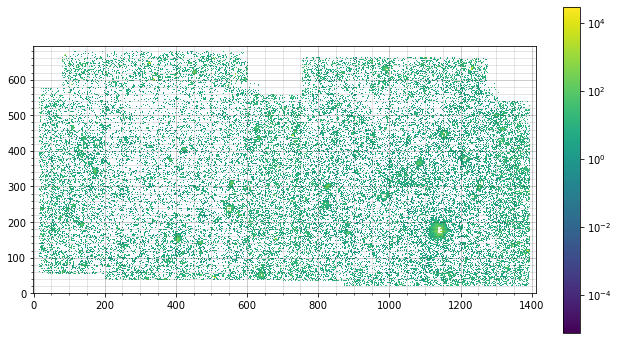

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1022.7806 21.203254 346.72953 12.794043    17.912325  0.20144214
  5 1029.6681 24.980677 346.72938 12.792742    15.925013 0.045077949
  2 1221.8437 22.230122 346.74242 12.763339    18.858741  0.31855601
  3 1252.2121 21.132988 346.74458 12.758735    20.393562    1.264634
  9 1251.3962 32.455876 346.74274 12.758137    18.009582  0.13705808
 13 1258.7999 37.729768  346.7424  12.75666     19.07861  0.36023565
  4 948.06848  24.88258 346.72405 12.805307    17.982331  0.07986602
  6 1271.8272 26.267837 346.74506 12.755388    17.690496  0.08468596
 12 1274.2285 36.188406 346.74365 12.754384    16.799578 0.047375889
  7 925.24121 28.027488 346.72205 12.808619    17.837157 0.072839548
...       ...       ...       ...       ...          ...         ...
 79 1201.5731 646.68034 346.64256 12.726508    17.864872  0.10128308
 81 95.078733 650.64426 346.56927 

Number of PSF stars: 648
 id    x_0       y_0    sharpness  ...    flux        mag      group_id
--- --------- --------- ---------- ... --------- ------------- --------
  1 1024.2248 21.305806 0.76987035 ... 1.1340261   -0.13655759        1
  2 1030.6804 24.685537 0.51031401 ... 6.9138985    -2.0993075        1
  3 1152.7436  24.84152 0.38323329 ... 1.0472804  -0.050157489        2
  4 1272.7376 26.421759 0.50656131 ... 1.7458585   -0.60502258        3
  7 1275.2134 35.944277 0.69539029 ... 2.8799725    -1.1484709        3
  5 1129.9474 29.340688 0.61533411 ...  1.108001   -0.11135039        4
  6 1252.1612 32.150196 0.66699526 ... 1.3682601   -0.34042164        5
  8 1305.8836 38.221878 0.44161437 ... 1.3755273   -0.34617303        6
  9 287.54386 38.328959 0.60441332 ... 1.1270927   -0.12989912        7
 10 782.75253 40.543398 0.60628276 ... 1.1491487   -0.15094053        8
...       ...       ...        ... ...       ...           ...      ...
638  1191.046 650.87598 0.68785904 ... 

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


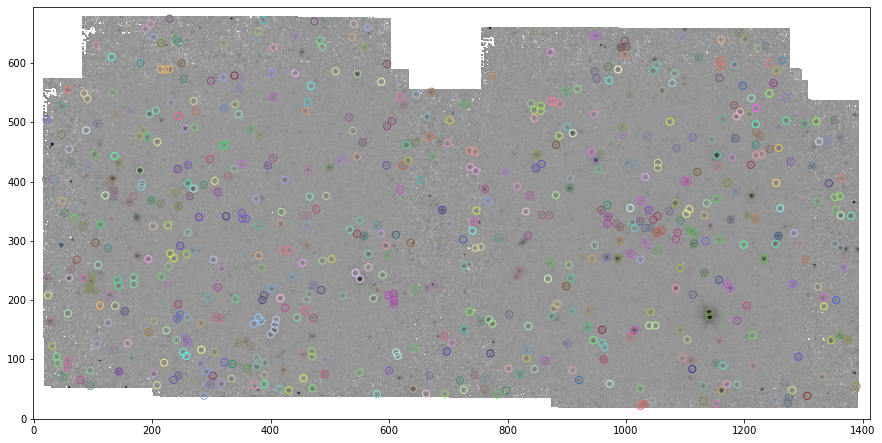

Time taken to fit PSF model: 13.707718300000124s


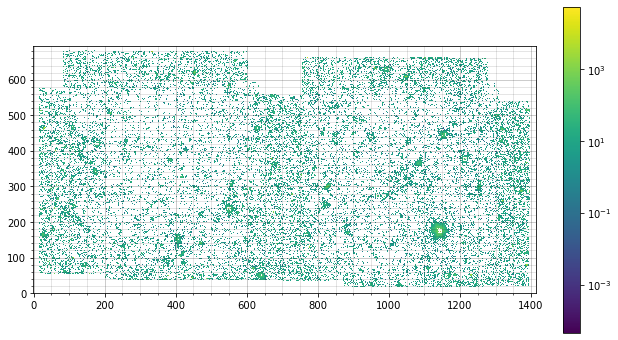

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1024.2248 21.305806 346.72949 12.793963    18.012964  0.23808613
  2 1030.6804 24.685537 346.72939 12.792753    15.956891 0.046229977
  3 1152.7436  24.84152 346.73737 12.773958    18.387233  0.16813954
  4 1272.7376 26.421759 346.74499 12.755391    17.733176 0.086420025
  7 1275.2134 35.944277 346.74365   12.7544    16.879547 0.050616018
  5 1129.9474 29.340688 346.73516 12.777179    19.265378  0.29903073
  6 1252.1612 32.150196 346.74274 12.758191    18.186053  0.15400443
  8 1305.8836 38.221878 346.74531 12.749535     18.21933  0.10661801
  9 287.54386 38.328959 346.67844 12.906239    17.805044  0.20810545
 10 782.75253 40.543398 346.71061 12.829892      18.3205  0.10221903
...       ...       ...       ...       ...          ...         ...
 85 84.257733 659.64436   346.567 12.897717    19.687555   1.1459881
 88 95.582534 661.63372 346.56743 

Number of PSF stars: 657
 id    x_0       y_0    sharpness  ...    flux        mag       group_id
--- --------- --------- ---------- ... --------- -------------- --------
  1 949.53842 23.200019 0.53597942 ... 1.3242184    -0.30489908        1
  2 1031.0859 24.204352 0.37110993 ... 6.5431394     -2.0394654        2
  3 1272.9016 25.470159 0.51944114 ... 1.4598557    -0.41077484        3
  4 1275.4752 35.850397 0.52970876 ... 2.9434338     -1.1721357        3
 11 1280.9368 47.008996 0.66252072 ...   1.95333    -0.72693904        3
  5 1293.4092 37.872907 0.68646959 ...  1.103324     -0.1067577        4
  6 782.69349 39.512747 0.79375472 ... 1.1928654    -0.19147862        5
  7  705.6189 40.045402 0.37781649 ... 1.1885445    -0.18753857        6
  8 662.73466 41.405304 0.48454281 ... 2.6164029     -1.0442615        7
  9 1341.8009 42.839054 0.41006163 ... 1.3562851    -0.33087745        8
...       ...       ...        ... ...       ...            ...      ...
647 1191.0181 650.11477 0.

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


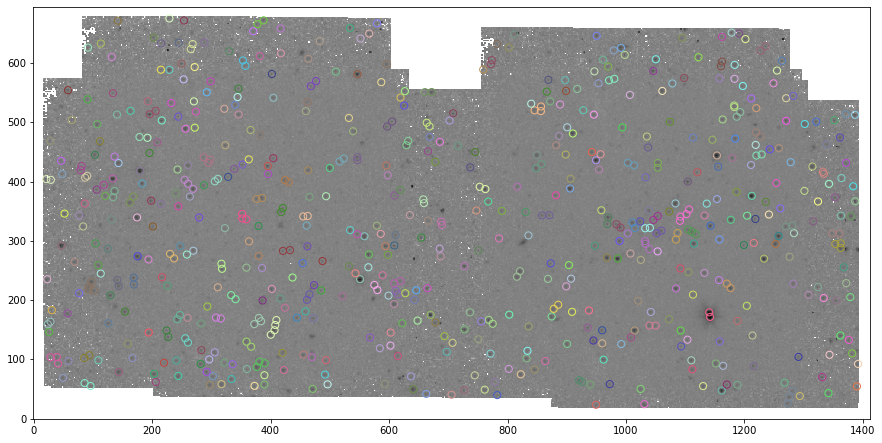

Time taken to fit PSF model: 14.236942000000454s


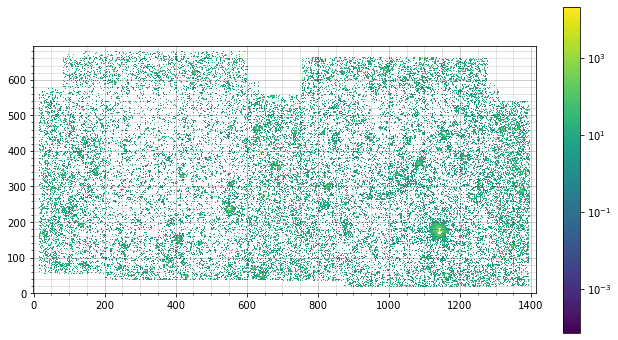

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 949.53842 23.200019  346.7242 12.805342    17.822296 0.088845606
  2 1031.0859 24.204352  346.7294 12.792729    15.990905 0.045524769
  3 1272.9016 25.470159 346.74508 12.755438    17.629981 0.075128696
  4 1275.4752 35.850397 346.74361 12.754378    16.801532 0.047170792
 11 1280.9368 47.008996 346.74221 12.752823     17.58862 0.076827579
  5 1293.4092 37.872907 346.74447 12.751489    19.366844  0.35721237
  6 782.69349 39.512747 346.71067  12.82997    18.235161 0.099537726
  7  705.6189 40.045402 346.70552 12.841795    18.404174  0.16786802
  8 662.73466 41.405304 346.70249 12.848306    17.301102 0.078855341
  9 1341.8009 42.839054 346.74686 12.743724    17.980212  0.08906285
...       ...       ...       ...       ...          ...         ...
103 100.03671  657.0713 346.56833 12.895416          nan         nan
104 107.17731 658.09833 346.56864 

Number of PSF stars: 665
 id    x_0       y_0    sharpness  ...    flux        mag       group_id
--- --------- --------- ---------- ... --------- -------------- --------
  1 1030.4679 24.478339 0.48797676 ... 6.8099535     -2.0828604        1
  2  1271.996 25.875152 0.74309696 ... 1.5149421    -0.45099008        2
  8 1274.5199 35.771747 0.66359841 ... 2.5672821      -1.023684        2
  3 888.31676 27.476571 0.42360715 ... 1.2027795    -0.20046506        3
  4 1016.9161 31.205348 0.50778008 ... 1.0001469 -0.00015949953        4
  5 1068.3571 32.027306 0.29470083 ... 1.1883214     -0.1873348        5
  6 1251.6183 31.564592 0.62963192 ... 1.6301432    -0.53056437        6
  7 1334.7788 33.885813 0.57480493 ... 1.1166724    -0.11981446        7
 12 1341.0643 42.007409 0.54395518 ... 1.1650155    -0.16582929        7
  9 1304.9562 38.015136  0.4745319 ... 1.3396106    -0.31744642        8
...       ...       ...        ... ...       ...            ...      ...
655 201.83885 642.55568 0.

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


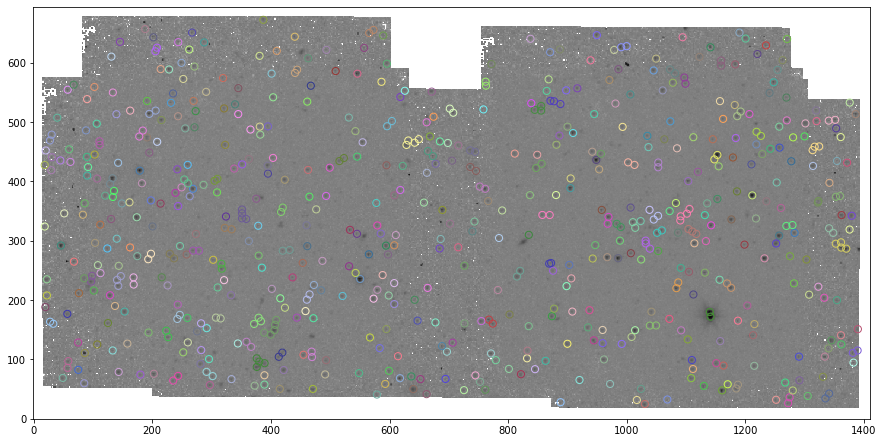

Time taken to fit PSF model: 14.565403399999923s


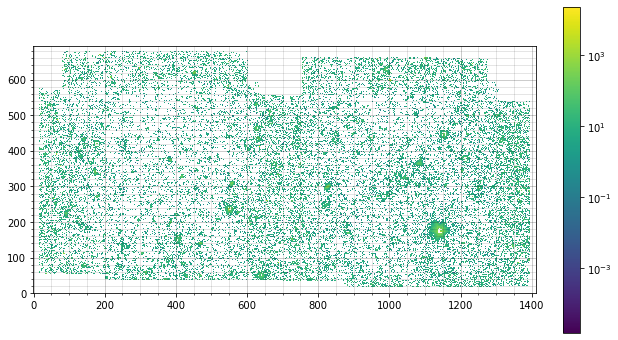

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1030.4679 24.478339 346.72939 12.792704    15.917247 0.042029943
  2  1271.996 25.875152 346.74504 12.755453    17.650223 0.085703087
  8 1274.5199 35.771747 346.74365 12.754431    16.926238 0.052275836
  3 888.31676 27.476571 346.71958 12.814382     19.51684  0.55574557
  4 1016.9161 31.205348 346.72744 12.794357     20.28028  0.83928258
  5 1068.3571 32.027306 346.73069  12.78639    20.156665   0.9064305
  6 1251.6183 31.564592 346.74281 12.758224    17.875475 0.086909825
  7 1334.7788 33.885813  346.7479  12.74528    18.645026  0.16192474
 12 1341.0643 42.007409 346.74703 12.743792    18.561629  0.15021748
  9 1304.9562 38.015136 346.74529 12.749604    18.131754  0.11284076
...       ...       ...       ...       ...          ...         ...
 89        83       632 346.57121 12.899496          nan         nan
 94 95.189574 650.50208 346.56909 

Number of PSF stars: 671
 id    x_0       y_0    sharpness  ...    peak      flux       mag      group_id
--- --------- --------- ---------- ... --------- --------- ------------ --------
  1 1023.1926 20.630013 0.69432863 ... 144.83318 1.1869653  -0.18609505        1
  3 1031.5858   23.8603 0.52193792 ... 492.69919 7.2939729   -2.1574104        1
  2 950.14886 23.433388 0.48063736 ... 141.03069 1.6140687  -0.51980503        2
  4 1153.9519 24.277346 0.34101544 ... 102.09286 1.4576445  -0.40912902        3
  5  1273.248 26.057294 0.71741541 ... 213.66397 2.2147942  -0.86333343        4
  6 1276.3812 35.800701 0.57624745 ... 291.71695 3.9088499   -1.4801225        4
 13  1280.913 46.478929 0.72708849 ... 203.09428 2.0213868  -0.76412356        4
  7 985.23278 37.020624 0.55902134 ... 128.07993 1.6260578  -0.52783992        5
  8 663.57149 40.491145 0.62915436 ... 207.28517 2.1611926   -0.8367337        6
  9 783.53834 39.585806 0.68109431 ... 156.81575 1.6690437  -0.55616927        7
...

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


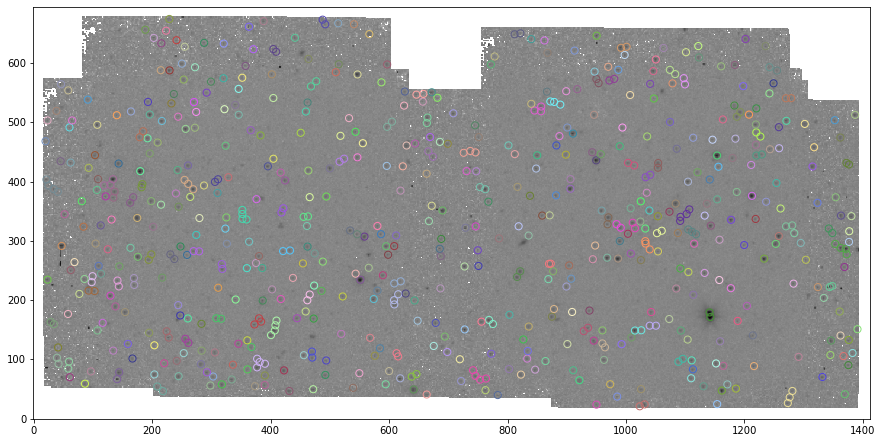

Time taken to fit PSF model: 14.880601800000477s


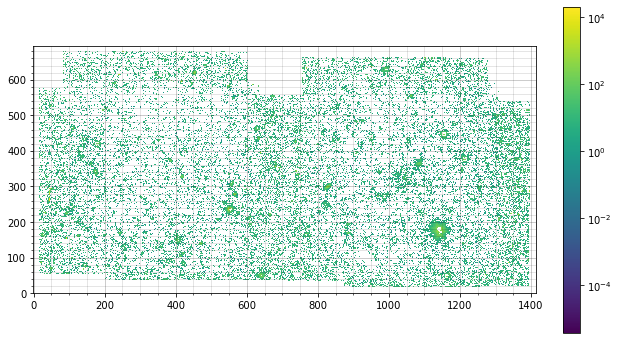

 id   x_fit     y_fit       RA       dec    apparent_mag   mag_err  
--- --------- --------- --------- --------- ------------ -----------
  1 1023.1926 20.630013 346.72941 12.794236    17.971403  0.19229902
  3 1031.5858   23.8603 346.72945 12.792737    15.885365 0.041995951
  2 950.14886 23.433388 346.72416 12.805293    17.818652 0.081215239
  4 1153.9519 24.277346 346.73743 12.773886    18.629934  0.19048031
  5  1273.248 26.057294 346.74499 12.755419    17.249552 0.061712621
  6 1276.3812 35.800701 346.74366 12.754312    16.668405 0.043388766
 13  1280.913 46.478929 346.74227  12.75293    17.475455  0.06628015
  7 985.23278 37.020624 346.72432 12.799024    18.489234  0.18530974
  8 663.57149 40.491145 346.70262 12.848284    17.247721 0.092650371
  9 783.53834 39.585806 346.71065 12.829888    17.927932 0.092884061
...       ...       ...       ...       ...          ...         ...
105 84.179363 676.62915  346.5641 12.896572          nan         nan
106 91.093653 676.67808 346.56455 

<ipython-input-8-a924e2e07d84>:316: RuntimeWarning: invalid value encountered in double_scalars
  var = sum((m - np.mean(mags.compressed()))**2 for m in mags.compressed()) / (len(mags.compressed()) - 1)


id_master    x_0       y_0        RA    ...  eta_inv       IQR       chi_sq  
--------- --------- --------- --------- ... ---------- ----------- ----------
        0 1023.3861 21.336295 346.72948 ... 0.49384477          -- 0.24739704
        1 1030.6396 24.900292 346.72939 ...  1.6090404   0.1154536  26.066344
        2  1172.343 21.167364 346.73926 ...         --          --         --
        3 949.26181 24.567034 346.72411 ... 0.44481307          --   10.25607
        4 1153.1168  25.51441 346.73732 ...        0.5          --  3.1765062
        5 1272.4713 26.122891 346.74504 ... 0.63667148   0.3089695  33.081267
        6 1275.3878 36.124401 346.74365 ... 0.57801163 0.091413179  21.380194
        7 1280.4128 47.399125  346.7422 ... 0.93070555          --  4.3371322
        8 1129.8404 29.485108 346.73517 ...         --          --          0
        9 1252.3323 32.110566 346.74278 ... 0.44186652  0.34097223  19.475788
      ...       ...       ...       ... ...        ...         .

In [8]:
print('Photometry method selected: {}'.format(method))

###   INITIALISING IMAGE WE'LL BE COMPARING OTHER EPOCHS TO WHEN STAR MATCHING   ###

epoch = 1  # counter to be incremented every epoch
LC_time = []

huge_table = copy.copy(master_stars['id_master', 'x_0', 'y_0', 'RA', 'dec'])

epsf_file = 'epsf_models/IC4499/epsf_'+channel+'_'+str(model_epoch)+'.pickle'
pickle_in = open(epsf_file, 'rb')
epsf = pickle.load(pickle_in)

norm = simple_norm(epsf.data, 'log', percent=99.)
plt.imshow(epsf.data, norm=norm, origin='lower', cmap='inferno')
plt.colorbar()
plt.show()

for filename in glob.glob(base_dir+'*/IC4499__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/IC4499__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    
    ###   OPENING FITS FILE AND CONVERTING TO COUNTS   ###
    
    with fits.open(filename) as hdu_list:        
        print(filename)
        image_data = hdu_list[0].data
        hdr = hdu_list[0].header
        exptime = hdr['EXPTIME']
        fluxconv = hdr['FLUXCONV']
        conv = exptime / fluxconv
        print('EXPTIME: {0}\nFLUXCONV: {1}'.format(exptime, fluxconv))
        data = image_data * conv
    
    if channel == '4p5um':
        data = data[:,0:1150]
    
    file_corr = base_dir+'IC4499__e'+str(epoch)+'/IC4499__e'+str(epoch)+'_correction_'+channel+'.fits'
    with fits.open(file_corr) as hdu_list:
        data_corr = hdu_list[0].data
    
    LC_time.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
        
    mean, median, std = sigma_clipped_stats(data, sigma=sigma_level)
    print('Mean: {0}\nMedian: {1}\nStd dev: {2}'.format(mean, median, std))
    
    
    
    if method == 'aperture':
    
        ###   LOCATING STARS AND PLOTTING THEM   ###
        # could maybe put most of this in its own starfind function? including aperture and position bits

        sources = star_find(data, sigma_level, FWHM, std, roundness, sharphi)
        #sources = star_find(data, 300., FWHM, std, roundness, sharphi)
        pos = np.transpose((sources['xcentroid'], sources['ycentroid']))
        apertures = CircularAperture(pos, r_ap)
        annuli = CircularAnnulus(pos, r_in, r_out)
        print('No. of stars detected: {0}'.format(len(sources)))
        plotting(data, apertures, annuli, 'Greys', choice='both_aps', savename=None)
        
        #starlist = np.array(sources['xcentroid', 'ycentroid'])
        #np.savetxt('outputs/IC4499/starlist_02.txt', starlist, delimiter=',')

        ###   DOING APERTURE PHOTOMETRY   ###

        phot_table = ap_phot(data, apertures, annuli, 'median')
        
        phot_table['apparent_mag'] = float('NaN')
        phot_table['mag_err'] = float('NaN')
        for i in range(len(phot_table)):
            locorr = data_corr[int(phot_table['ycenter'][i].value)][int(phot_table['xcenter'][i].value)]  # location-dependent correction at star's location
            if phot_table['star_bkgsub'][i] >= 0:
                phot_table['apparent_mag'][i] = zmag - 2.5 * math.log10(apcorr * locorr * phot_table['star_bkgsub'][i] / conv)
                phot_table['mag_err'][i] = apparent_magnitude_err(phot_table['star_bkgsub'][i], apcorr, zmag_err, phot_table['counts_err'][i], apcorr_err)
        
        phot_table.write('outputs/IC4499/table_'+channel+'_e'+str(epoch)+'.txt', format='csv', overwrite=True)
        #print_table_nicely(phot_table)
        print_table_nicely(phot_table['id', 'xcenter', 'ycenter', 'star_bkgsub', 'counts_err', 'apparent_mag', 'mag_err'])
        
        match_table = copy.copy(phot_table)
        del match_table['aperture_sum_0', 'aperture_sum_1', 'bkg_sum_median', 'star_bkgsub', 'counts_err']
        mag_name = 'mag_e'+str(epoch)
        err_name = 'err_e'+str(epoch)
        match_table.rename_column('apparent_mag', mag_name)
        match_table.rename_column('mag_err', err_name)
        
        


    
    elif method == 'PSF':
        
        ###   DETECTING MORE STARS   ###
        
        sources_PSF = star_find(data, sigma_level, FWHM, std, roundness, sharphi=0.85)
        
        sources_PSF['xcentroid', 'ycentroid'].write('outputs/IC4499/epoch_'+str(epoch)+'_list_test.txt', format='csv', overwrite=True)
        
        #sources_PSF = star_find(data, sigma_level, FWHM, std, roundness, sharphi)
        pos_PSF = np.transpose((sources_PSF['xcentroid'], sources_PSF['ycentroid']))
        ap_PSF = CircularAperture(pos_PSF, r_ap)
        #plotting(data, ap_PSF, an=None, cmap='Greys', choice='ap_only', savename='psf_detect_test_00.png')
        print('Number of PSF stars: {}'.format(len(sources_PSF)))
        
        ###   MASKING BRIGHT REGION IN CHANNEL 2   ###

        if channel == '4p5um':
            x_mask = sources_PSF['xcentroid']
            y_mask = sources_PSF['ycentroid']
            del sources_PSF
            xlim = 1150
            mask_m = (x_mask < xlim)
            sources_PSF = Table()
            sources_PSF['xcentroid'] = x_mask[mask_m]
            sources_PSF['ycentroid'] = y_mask[mask_m]

            pos_mask = np.transpose((sources_PSF['xcentroid'], sources_PSF['ycentroid']))
            ap_mask = CircularAperture(pos_mask, r_ap)
            plotting(data, ap_mask, an=None, cmap='Greys', choice='ap_only', savename=None)
        
        ###   GROUPING STARS BASED ON PROXIMITY TO NEIGHBOURS   ###
        
        sources_PSF['xcentroid'].name = 'x_0'
        sources_PSF['ycentroid'].name = 'y_0'
        daogroup = DAOGroup(crit_separation=2.5*FWHM)
        #daogroup = DAOGroup(crit_separation=4*FWHM)
        star_groups = daogroup(sources_PSF)
        star_groups = star_groups.group_by('group_id')
        print_table_nicely(star_groups)
        
        ncolors = max(star_groups['group_id'])
        cmap = make_random_cmap(ncolors=ncolors, seed=1612)
        plt.imshow(data, origin='lower', norm=LogNorm(), interpolation='nearest', cmap='Greys')
        for i, group in enumerate(star_groups.groups):
            pos_group = np.transpose([group['x_0'], group['y_0']])
            ap_group = CircularAperture(pos_group, r_ap)
            ap_group.plot(color=cmap.colors[i], lw=1.)
        plt.gcf().set_size_inches(15, 9)
        plt.show()
        
        ###   ALIGNING MASTER STAR POSITIONS WITH EPOCH FRAME   ###
        # currently not using this part, but i've left it just in case i revert back
        
        '''transf, (src_list, trg_list) = aa.find_transform(data_m, data)
        #master_xy = np.array([(master_stars['x_0'], master_stars['y_0'])])
        master_xy = np.transpose((master_stars['x_0'], master_stars['y_0']))
        transf_list = aa.matrix_transform(master_xy, transf.params)
        print(len(transf_list))
        print(transf_list)'''
        
        ###   DOING PSF PHOTOMETRY   ###
        
        data_nonans = np.nan_to_num(data, nan=0.00001, copy=True) # changing NaN values to a float so PSF fit doesn't crash
        
        #bkg_estimation = MMMBackground()
        #fitter = LevMarLSQFitter()
        daofind_PSF = DAOStarFinder(threshold=sigma_level*std, fwhm=FWHM, roundlo=-roundness, roundhi=roundness, sharphi=0.85)
        fit_rad = 5
        
        epsf.x_0.fixed = True
        epsf.y_0.fixed = True
        init_pos = Table(names=['x_0', 'y_0'], data=[sources_PSF['x_0'], sources_PSF['y_0']])
        #init_pos = Table(names=['x_0', 'y_0'], data=transf_list)
        
        start = time.perf_counter()
        PSF_photometry = ISPSF(finder = daofind_PSF,
                              group_maker = daogroup,
                              bkg_estimator = MMMBackground(),
                              psf_model = epsf,
                              fitter = LevMarLSQFitter(),
                              fitshape = 2*fit_rad+1,
                              niters = 2,
                              aperture_radius = 6.)
        PSF_table = PSF_photometry(image=data_nonans, init_guesses=init_pos)
        residual_image = PSF_photometry.get_residual_image()
        print('Time taken to fit PSF model: {}s'.format(time.perf_counter() - start))
        
        plotting(residual_image, ap=None, an=None, cmap='viridis', choice=None, savename=None)
        
        PSF_table['apparent_mag'] = float('NaN')
        PSF_table['mag_err'] = float('NaN')
        for i in range(len(PSF_table)):
            locorr = data_corr[int(PSF_table['y_fit'][i])][int(PSF_table['x_fit'][i])]  # location-dependent correction at star's location
            if PSF_table['flux_fit'][i] >= 0:
                PSF_table['apparent_mag'][i] = zmag - 2.5 * math.log10(apcorr * locorr * PSF_table['flux_fit'][i] / conv)
                PSF_table['mag_err'][i] = apparent_magnitude_err(PSF_table['flux_fit'][i], apcorr, zmag_err, PSF_table['flux_unc'][i], apcorr_err)
        
        
        cat, ra, dec = make_catalog(PSF_table['x_fit'], PSF_table['y_fit'], hdr)
        PSF_table['RA'] = ra
        PSF_table['dec'] = dec
        
        #print_table_nicely(PSF_table['id', 'group_id', 'iter_detected', 'x_fit', 'y_fit', 'apparent_mag', 'mag_err'])
        print_table_nicely(PSF_table['id', 'x_fit', 'y_fit', 'RA', 'dec', 'apparent_mag', 'mag_err'])
        PSF_table['id', 'RA', 'dec', 'x_fit', 'y_fit', 'apparent_mag', 'mag_err'].write('outputs/IC4499/matching/'+method+'_'+channel+'_matching_e'+str(epoch)+'.txt', format='csv', overwrite=True, delimiter=' ')
        
        save_name_ep = 'phot_tables/IC4499/epochs/phot_table_'+method+'_'+channel+'_e'+str(epoch)+'.pickle'
        pickle_out_ep = open(save_name_ep, 'wb')
        pickle.dump(PSF_table, pickle_out_ep)
        pickle_out_ep.close()
        
        match_table = copy.copy(PSF_table)
        del match_table['x_0', 'y_0', 'flux_0', 'flux_fit', 'flux_unc', 'iter_detected']
        mag_name = 'mag_e'+str(epoch)
        err_name = 'err_e'+str(epoch)
        match_table.rename_column('apparent_mag', mag_name)
        match_table.rename_column('mag_err', err_name)
        match_table.rename_column('x_fit', 'xcenter')
        match_table.rename_column('y_fit', 'ycenter')
        
        
    
    
    ###   COMPARING AGAINST MASTER LIST   ###

    comp_table = copy.copy(huge_table)
    #del comp_table['sharpness', 'roundness1', 'roundness2', 'npix', 'sky', 'peak', 'flux', 'mag']
    #comp_table['id', 'RA', 'dec', 'xcenter', 'ycenter', 'apparent_mag', 'mag_err'].write('outputs/IC4499/comp_table_'+channel+'_e'+str(epoch)+'.txt', format='csv', overwrite=True, delimiter=' ')

    cat_match, ra, dec = make_catalog(match_table['xcenter'], match_table['ycenter'], hdr)
    match_table['RA'] = ra
    match_table['dec'] = dec
    #match_table['id', 'RA', 'dec', 'xcenter', 'ycenter', 'apparent_mag', 'mag_err'].write('outputs/IC4499/match_table_'+channel+'_e'+str(epoch)+'.txt', format='csv', overwrite=True, delimiter=' ')

    idx, d2d, d3d = cat_match.match_to_catalog_sky(cat_m)

    # Selection criteria:
    max_sep = 0.25 * u.arcsec
    selection = (d2d > max_sep)
    match_index = idx
    match_index[selection] = -99.
    ind = ((match_index >= 0))  # keeps only positive indices (ie. removes -99s)
    #sumind = sum(ind)
    #print('Number of common stars: {}'.format(sumind))

    match_table = match_table[ind]
    comp_table = comp_table[match_index][ind]
    #print_table_nicely(match_table['id', 'RA', 'dec', 'apparent_mag', 'mag_err'])
    #print_table_nicely(comp_table['id_master', 'RA', 'dec'])

    match_table['id_master'] = comp_table['id_master']

    match_table = Table(match_table, masked=True)

    huge_table = join(huge_table, match_table['id_master', mag_name, err_name], keys='id_master', join_type='left')
    print_table_nicely(huge_table)
    
    print('\n\n\n')
    
    if run_all == False:
        break
    
    #if epoch == 2:
    #    break
    
    epoch += 1
    
###   CALCULATING VARIABILITY INDICES AND AMPLITUDE FOR EACH STAR   ###

if run_all == True:
    
    masked_array = np.ma.array(np.zeros(len(huge_table)), mask=True)
    huge_table['amp'] = masked_array
    huge_table['eta_inv'] = masked_array
    huge_table['IQR'] = masked_array
    huge_table['chi_sq'] = masked_array

    huge_table_f = copy.copy(huge_table.filled(-99))

    for i in range(len(huge_table_f)):
        #print(i)

        # Putting magnitudes into an array so we can play with them:
        mags = []
        errs = []
        for j in range(1,13):
            mags.append(huge_table_f['mag_e'+str(j)][i])
            errs.append(huge_table_f['err_e'+str(j)][i])

        mags = np.ma.array(mags)
        mags = np.ma.masked_where(mags == -99, mags)
        errs = np.ma.array(errs)
        errs = np.ma.masked_where(errs == -99, errs)

        # Calculating amplitude:
        if mags.compressed().size:    # doesn't calculate anything extra if the star has no magnitude data
            # Amplitude:
            amp = max(mags.compressed()) - min(mags.compressed())
            huge_table['amp'][i] = amp

            # Chi squared test:
            mean_sum1 = sum((m / e**2) for m, e in zip(mags.compressed(), errs.compressed()))
            mean_sum2 = sum((1. / e**2) for e in errs.compressed())
            mean_chi = mean_sum1 / mean_sum2

            chi_sq = sum(((m - mean_chi) / e)**2 for m, e in zip(mags.compressed(), errs.compressed()))
            huge_table['chi_sq'][i] = chi_sq

            # IQR:
            mags_sorted = sorted(mags.compressed())
            if len(mags_sorted) > 5:  # finding IQR for fewer than 6 values is pointless really, and can cause issues
                if len(mags_sorted) % 2 == 1:   # if odd number of entries, remove the median
                    mags_sorted.pop(int(len(mags_sorted)/2))

                mags_split= np.array_split(mags_sorted, 2)
                mags_lo = mags_split[0]
                mags_hi = mags_split[1]

                n = int(len(mags_lo) / 2)
                q25 = (mags_lo[n-1] + mags_lo[n]) / 2
                q75 = (mags_hi[n-1] + mags_hi[n]) / 2
                iqr = q75 - q25
                huge_table['IQR'][i] = iqr

            # von Neumann index:
            # (VERY important this is run LAST out of all the indices, otherwise 'continue' may skip them)
            var = sum((m - np.mean(mags.compressed()))**2 for m in mags.compressed()) / (len(mags.compressed()) - 1)
            diff = 0
            for k in range(len(mags.compressed()) - 1):
                diff += (mags.compressed()[k+1] - mags.compressed()[k])**2
            if (len(mags.compressed()) - 1) == 0:
                continue
            mssd = diff / (len(mags.compressed()) - 1)
            if mssd == 0. or var == 0.:
                continue
            eta_inv = var / mssd
            huge_table['eta_inv'][i] = eta_inv
        



    print_table_nicely(huge_table)

    if method == 'aperture':
        save_name = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'.pickle'
    elif method == 'PSF':
        save_name = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

    pickle_out = open(save_name, 'wb')
    pickle.dump(huge_table, pickle_out)
    pickle_out.close()    



In [7]:
if method == 'aperture':
    load_name = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table = pickle.load(pickle_in)

#huge_table.show_in_notebook()

### Run this to add Welch-Stetson variability index to huge_table:
Requires data from both channels, so this won't work for PAL 13 :(

In [9]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um.pickle'
    load_name_normal = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'.pickle'
    save_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'
    load_name_normal = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    save_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
pickle_in = open(load_name_ch2, 'rb')
huge_table_ch2 = pickle.load(pickle_in)
pickle_in = open(load_name_normal, 'rb')
huge_table = pickle.load(pickle_in)

cat_ch1 = SkyCoord(huge_table_ch1['RA'], huge_table_ch1['dec'], frame='icrs', unit='deg')
cat_ch2 = SkyCoord(huge_table_ch2['RA'], huge_table_ch2['dec'], frame='icrs', unit='deg')

idx, d2d, d3d = match_coordinates_sky(cat_ch1, cat_ch2)  # idx correspond to ch1

#print(len(idx))
#print(len(cat_ch1))

max_sep = 0.4 * u.arcsec  # looking at maximum distance between matching RA/dec coords, around 0.4 seems to work decently
selection = (d2d > max_sep)
match_index = idx
match_index[selection] = -99.
ind = ((match_index >= 0))  # keeps only positive indices (ie. removes -99s)

huge_table_ch1 = huge_table_ch1[ind]
huge_table_ch2 = huge_table_ch2[match_index][ind]
#print(len(huge_table_ch1))

id_list = np.arange(len(huge_table_ch1))
huge_table_ch1['id_match'] = id_list
huge_table_ch2['id_match'] = id_list

masked_array = np.ma.array(np.zeros(len(huge_table_ch1)), mask=True)
huge_table_ch1['I_var'] = masked_array
huge_table_ch2['I_var'] = masked_array

huge_table_ch1_f = copy.copy(huge_table_ch1.filled(-99))
huge_table_ch2_f = copy.copy(huge_table_ch2.filled(-99))

for i in range(len(huge_table_ch1)):
    #print(i)
    mags_ch1 = []
    mags_ch2 = []
    errs_ch1 = []
    errs_ch2 = []
    for j in range(1,13):
        mags_ch1.append(huge_table_ch1_f['mag_e'+str(j)][i])
        mags_ch2.append(huge_table_ch2_f['mag_e'+str(j)][i])
        errs_ch1.append(huge_table_ch1_f['err_e'+str(j)][i])
        errs_ch2.append(huge_table_ch2_f['err_e'+str(j)][i])

    mags_ch1 = np.ma.array(mags_ch1)
    mags_ch1 = np.ma.masked_where(mags_ch1 == -99, mags_ch1)
    mags_ch2 = np.ma.array(mags_ch2)
    mags_ch2 = np.ma.masked_where(mags_ch2 == -99, mags_ch2)
    errs_ch1 = np.ma.array(errs_ch1)
    errs_ch1 = np.ma.masked_where(errs_ch1 == -99, errs_ch1)
    errs_ch2 = np.ma.array(errs_ch2)
    errs_ch2 = np.ma.masked_where(errs_ch2 == -99, errs_ch2)
    
    m1_mean = np.mean(mags_ch1.compressed())
    m2_mean = np.mean(mags_ch2.compressed())
    n = len(mags_ch1)   # could also be len(mags_ch2)
    
    # probably need to do a for loop instead of list comprehension
    # check if number of mags in ch1 and ch2 list match; if not, don't calculate
    # doesn't guarantee that the mags are from the same epochs, even if the length matches; might need to only calculate for stars with 12 observations :/
    # unless we wanna get complicated and check that each list has values in the same places
    
    '''if len(mags_ch1.compressed()) == 12 and len(mags_ch2.compressed()) == 12:
        count += 1
        print('yay they are both big')
        
        I = sum((((m1-m1_mean)/e1) * ((m2-m2_mean)/e2)) for m1, m2, e1, e2 in zip(mags_ch1, mags_ch2, errs_ch1, errs_ch2)) * np.sqrt(1. / (n*(n-1)))

        print(len(mags_ch1.compressed()))
        print(len(mags_ch2.compressed()))
        print('I: ', I, '\n')

        huge_table_ch1['I_var'][i] = I
        huge_table_ch2['I_var'][i] = I'''
    
    I_prod = 0
    count_unmasked = 0
    
    for k in range(len(mags_ch1)):
        if np.ma.is_masked(mags_ch1[k]) == True:
            #print('ch1 is masked')
            continue
        elif np.ma.is_masked(mags_ch2[k]) == True:
            #print('ch2 is masked')
            continue
        else:
            #print('neither masked :)')
            count_unmasked += 1
            I_prod += ((mags_ch1[k] - m1_mean) / errs_ch1[k]) * ((mags_ch2[k] - m2_mean) / errs_ch2[k])
        
    #print('count unmasked: ', count_unmasked)
    if count_unmasked > 5:
        I = I_prod * np.sqrt(1. / n * (n - 1))
        #print('I: ', I)
        huge_table_ch1['I_var'][i] = I
        huge_table_ch2['I_var'][i] = I
    #else:
        #print('too few good values to calculate I :(')
    
    #print(huge_table_ch1['I_var'][i])
    #print('\n')


huge_table_var = join(huge_table, huge_table_ch1['id_master', 'I_var'], keys='id_master', join_type='left')

pickle_out = open(save_name, 'wb')
pickle.dump(huge_table_var, pickle_out)
pickle_out.close() 

huge_table_var

FileNotFoundError: [Errno 2] No such file or directory: 'phot_tables/PAL13/huge_table_PSF_4p5um_model_emaster.pickle'

<ipython-input-70-7f55f072592f>:15: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


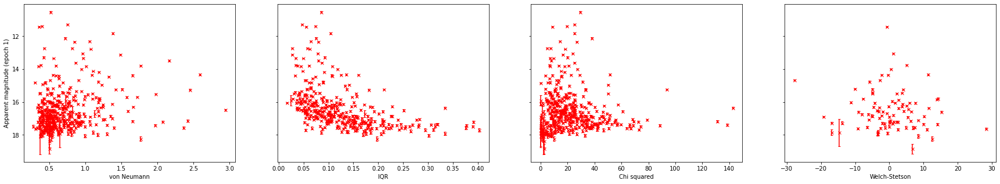

In [70]:
if method == 'aperture':
    load_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table_var = pickle.load(pickle_in)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 5), sharey=True)
ax1.errorbar(huge_table_var['eta_inv'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax1.set(xlabel='von Neumann', ylabel='Apparent magnitude (epoch 1)')
ax1.invert_yaxis()
ax2.errorbar(huge_table_var['IQR'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax2.set(xlabel='IQR')
ax3.errorbar(huge_table_var['chi_sq'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax3.set(xlabel='Chi squared')
ax4.errorbar(huge_table_var['I_var'], huge_table_var['mag_e1'], yerr=huge_table_var['err_e1'], fmt='x', color='red', capsize=2, markersize=5)
ax4.set(xlabel='Welch-Stetson')

fig.savefig('images/IC4499/variability/subplot_all.png', dpi=200)
fig.show()

### Plotting big variability grid for IC4499:
NOTE: haven't adjusted these parameters for IC4499 yet, it might not work

In [7]:
if method == 'aperture':
    load_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table_var = pickle.load(pickle_in)

huge_df = huge_table_var.to_pandas()

#huge_df['hue_key'] = huge_df['eta_inv']
huge_df['variable'] = 'no'

huge_df['hue_key'] = pd.qcut(huge_df['eta_inv'], q=3, labels=['low', 'medium', 'high'])
huge_df['hue_key'] = pd.Categorical(huge_df['hue_key'], categories=['low', 'medium', 'high', 'RRL']) # adding RRL category

#huge_df = huge_df.cat.add_categories(['RRL'])

if channel == '3p6um':
    huge_df['variable'][632] = 'RRL1'
    huge_df['variable'][37]  = 'RRL3'
    huge_df['variable'][617] = 'RRL5'
    huge_df['hue_key'][632, 37, 617] = 'RRL'
elif channel == '4p5um':
    huge_df['variable'][658] = 'RRL1'
    huge_df['variable'][506] = 'RRL2'
    huge_df['variable'][60]  = 'RRL3'
    huge_df['variable'][255] = 'RRL4'
    huge_df['variable'][640] = 'RRL5'
    huge_df['hue_key'][658, 506, 60, 255, 640] = 'RRL'



mega_plot = sns.pairplot(huge_df[['chi_sq', 'IQR', 'I_var', 'eta_inv', 'hue_key']], hue='hue_key', palette='CMRmap_r', markers=['.','.','.','X'], plot_kws={'s': 100})
mega_plot._legend.set_title('Variability (based on eta_inv)')

#mega_plot._legend.remove()

#mega_plot.savefig('images/IC4499/variability/best_mega_plot_'+channel+'.png', dpi=200)
#fig.show()

FileNotFoundError: [Errno 2] No such file or directory: 'phot_tables/PAL13/huge_table_var_PSF_3p6um_model_emaster.pickle'

In [33]:
test_df = copy.copy(huge_df)

test_df['hue_key'] = pd.qcut(test_df['eta_inv'], q=3, labels=['low', 'medium', 'high'])

test_df

,id_master,x_0,y_0,RA,dec,mag_e1,err_e1,mag_e2,err_e2,mag_e3,...,err_e11,mag_e12,err_e12,amp,eta_inv,IQR,chi_sq,I_var,hue_key,variable
0,0,1269.506326,28.576869,229.063032,-0.156443,16.823971,0.058122,16.957007,0.063766,17.084344,...,0.055009,NaN,NaN,0.260373,0.840250,0.195389,16.441654,NaN,high,no
1,1,1140.273967,29.994286,229.066273,-0.135148,17.349971,0.056014,17.194467,0.059591,17.082898,...,0.054542,17.113198,0.069184,0.430835,1.107865,0.222677,54.222092,NaN,high,no
2,2,1302.532358,30.413832,229.061841,-0.161826,16.267656,0.078471,16.250014,0.076104,16.236939,...,0.073235,16.126407,0.078961,0.171981,0.511458,0.113137,5.883287,NaN,medium,no
3,3,799.686317,39.347906,229.073893,-0.078874,16.848318,0.058436,16.942163,0.049819,16.827258,...,0.054227,16.596978,0.050690,0.406429,0.740310,0.089322,36.915060,1.433951,high,no
4,4,1264.216151,40.472713,229.061217,-0.155253,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
860,860,1194.215089,651.154848,228.962650,-0.127318,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,no
861,861,1071.982504,658.140967,228.964788,-0.107024,17.383965,0.116806,17.472029,0.102119,17.497485,...,0.072597,17.282309,0.065077,0.248917,0.368902,0.170279,12.395975,NaN,low,no
862,862,97.750837,659.597650,228.990744,0.053263,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no
863,863,1035.205090,659.595359,228.965537,-0.100936,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,NaN,NaN,no


### Plotting light curves:
NOTE: haven't downloaded IC4499 light curves from Gaia for comparison yet, so that section is commented out.

data/PAL13\PAL13__e1\PAL13__e1_3p6um.fits
data/PAL13\PAL13__e2\PAL13__e2_3p6um.fits
data/PAL13\PAL13__e3\PAL13__e3_3p6um.fits
data/PAL13\PAL13__e4\PAL13__e4_3p6um.fits
data/PAL13\PAL13__e5\PAL13__e5_3p6um.fits
data/PAL13\PAL13__e6\PAL13__e6_3p6um.fits
data/PAL13\PAL13__e7\PAL13__e7_3p6um.fits
data/PAL13\PAL13__e8\PAL13__e8_3p6um.fits
data/PAL13\PAL13__e9\PAL13__e9_3p6um.fits
data/PAL13\PAL13__e10\PAL13__e10_3p6um.fits
data/PAL13\PAL13__e11\PAL13__e11_3p6um.fits
data/PAL13\PAL13__e12\PAL13__e12_3p6um.fits
[56524.37243767361, 56524.434811921295, 56524.496870393516, 56524.55862994213, 56524.62487443287, 56524.677250127315, 56524.73901320602, 56524.802780798615, 56524.86136105324, 56524.921150208334, 56524.98415725694, 56525.04442045139]
<SkyCoord (ICRS): (ra, dec) in deg
    (346.67975, 12.77994444)>
RRab
Star ID:  499
Mags:  [16.26661708 16.40336532 16.25561945 16.21357706 16.17212285 16.13067575
 16.20276925 16.24837544 16.28597434 16.43195094 16.5926465  16.52396536]
Errs:  [0.03268241

C:\Users\Jake\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:746: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


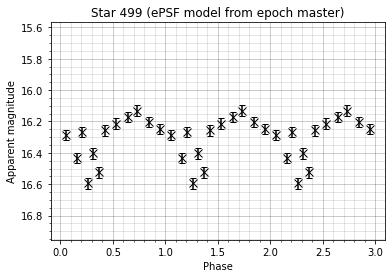

Amplitude:      0.4619707542014382
Chi squared:    195.28338314659624
IQR:            0.20948497928265297
von Neumann:    2.1682954387124647


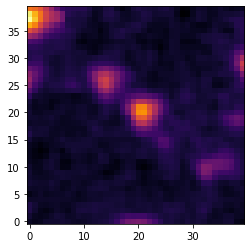

C:\Users\Jake\anaconda3\lib\site-packages\matplotlib\colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


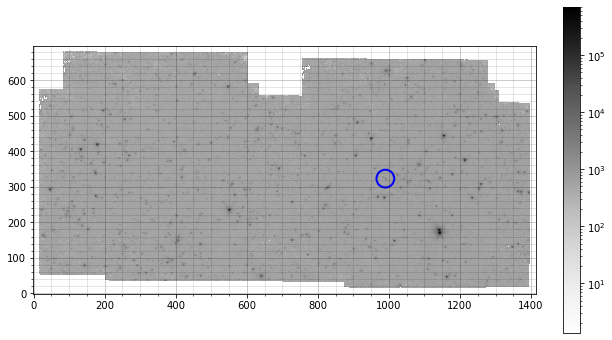

In [10]:
if method == 'aperture':
    #load_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'.pickle'
    load_name = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    #load_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    load_name = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name, 'rb')
huge_table = pickle.load(pickle_in)

LC_time = []
for filename in glob.glob(base_dir+'*/IC4499__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/IC4499__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        print(filename)
        hdr = hdu_list[0].header
    
    LC_time.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
    
print((LC_time))

###################
cat_or_rand = 'cat'
###################

if cat_or_rand == 'cat':
    
    ###   FOR PLOTTING STAR FROM CATALOGUE   ###
    
    ################ # note: 4 only in ch1; 3 only in ch2
    desired_star = 2
    ################
    
    file_CC = 'data/reference/CVSGC_IC4499_readable.txt'
    df_CC = pd.read_csv(file_CC, sep=',', header=0)
    '''if desired_star >= 5:
        ra_temp = df_CC['RA'][desired_star]
        dec_temp = df_CC['dec'][desired_star]
        #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
        c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
    else:
        c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star])'''
    
    c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star], frame='icrs', unit='deg')
    c_comp = SkyCoord(huge_table['RA']*u.degree, huge_table['dec']*u.degree)
    
    print(c_CC)
    
    if df_CC['type'][desired_star] == 'RR0':
        P = df_CC['period_fund'][desired_star]
        print('RRab')
    elif df_CC['type'][desired_star] == 'RR1':
        P = df_CC['period_FO'][desired_star]
        print('RRc')
    elif df_CC['type'][desired_star] == 'RR01':
        P = df_CC['period_FO'][desired_star]
        
    temp = [i / P for i in LC_time]
    phase = temp - np.floor(temp)  

    star_id, d2d, d3d = c_CC.match_to_catalog_sky(c_comp)
    print('Star ID: ', star_id)
    
    
else:
    
    ###   FOR PLOTTING RANDOM OR SPECIFIC STAR IN TABLE   ###

    #star_id = random.randint(0,len(huge_table))
    #star_id = 286
    star_id = 42
    print('Star ID: ', star_id)
    phase = LC_time
    #desired_star = -99


huge_table_f = copy.copy(huge_table.filled(-99))

mags = []
errs = []
for i in range(1,13):
    mags.append(huge_table_f['mag_e'+str(i)][star_id])
    errs.append(huge_table_f['err_e'+str(i)][star_id])
    
### Masking out a specific data point (only use in emergencies, or the Science Police will get you):

#remove_pls = 5  # EPOCH number of bad point
#mags[remove_pls-1] = -99
#print(mags)

###

mags = np.ma.array(mags)
mags = np.ma.masked_where(mags == -99, mags)
errs = np.ma.array(errs)
errs = np.ma.masked_where(errs == -99, errs)
phase = np.ma.masked_array(phase, mags.mask)
print('Mags: ', mags)
print('Errs: ', errs)
print('Phase: ', phase)

###   PLOTTING LIGHT CURVES   ###

mags_long = np.ma.concatenate((mags, mags, mags))  # this idea taken from some of vicky's code; credit?
errs_long = np.ma.concatenate((errs, errs, errs))
phase_long = np.ma.concatenate((phase, phase + 1., phase + 2.))

plt.errorbar(phase_long, mags_long, yerr=errs_long, fmt='x', color='black', capsize=3, markersize=8)
plt.ylim(np.nanmedian(mags) - 1.5*(max(mags)-min(mags)), np.nanmedian(mags) + 1.5*(max(mags)-min(mags)))
#plt.xlim(0, 1)
plt.gca().invert_yaxis()
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
if cat_or_rand == 'cat':
    plt.xlabel('Phase')
else:
    plt.xlabel('Observation time')
plt.ylabel('Apparent magnitude')
plt.title('Star '+str(star_id)+' (ePSF model from epoch '+str(model_epoch)+')')
#plt.savefig('images/IC4499/curves/'+method+'_'+channel+'_'+str(star_id)+'_'+str(model_epoch)+'.png', dpi=100)
plt.show()

###   GAIA DR2 CURVE COMPARISON   ###

'''vot_name = 'data/curves/proc_RRL'+str(desired_star+1)+'.vot'

if os.path.isfile(vot_name) == True:
    
    votable = parse_single_table(vot_name)
    data_vot = votable.array

    temp = [i / P for i in data_vot['obs_time']]
    phase_vot = temp - np.floor(temp)

    mags_vot = np.concatenate((data_vot['phot'], data_vot['phot'], data_vot['phot']))
    phases_vot = np.concatenate((phase_vot, phase_vot + 1., phase_vot + 2.))

    plt.plot(phases_vot, mags_vot, 'kx')
    plt.xlabel('Phase')
    plt.ylabel('Magnitude')
    plt.gca().invert_yaxis()
    plt.title('Gaia curve for RRL'+str(desired_star+1))
    plt.savefig('images/IC4499/curves/gaia/RRL'+str(desired_star+1), dpi=200)
    plt.show()'''

###   PRINTING VARIABILITY INFORMATION ETC.   ###

print('Amplitude:     ', huge_table['amp'][star_id])
print('Chi squared:   ', huge_table['chi_sq'][star_id])
print('IQR:           ', huge_table['IQR'][star_id])
#print('Welch-Stetson: ', huge_table['I_var'][star_id])
print('von Neumann:   ', huge_table['eta_inv'][star_id])

###   PLOTTING IMAGE OF STAR FROM MASTER FRAME   ###

star_r = 20
star_x = int(huge_table['x_0'][star_id])
star_y = int(huge_table['y_0'][star_id])
star_ap = CircularAperture((star_x, star_y), r=25.)

region = data_m[star_y-star_r:star_y+star_r, star_x-star_r:star_x+star_r]
plt.imshow(region, cmap='inferno', origin='lower', norm=LogNorm(), interpolation='nearest', aspect='equal')
#star_ap.plot(color='white')
plt.show()

plt.imshow(data_m, cmap='Greys', origin='lower', norm=LogNorm(), interpolation='nearest')
star_ap.plot(color='blue', lw=2.)
plt.colorbar(fraction = 0.05)
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gcf().set_size_inches(10, 6)
plt.show()

#plotting(data_m, star_ap, an=None, cmap='Greys', choice='ap_only', savename=None)

### Looking at a star in all epochs:

RRL2:
Even though magnitudes from epochs 2, 3, 7, 8 are missing when joined with master table, from manual inspection only epochs 2 and 8 mistake another star for RRL2

In [12]:
################ # note: 1,3 are only visible in channel 2
desired_star = 6
################

file_CC = 'data/reference/CVSGC_IC4499_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)
'''if desired_star >= 5:
    ra_temp = df_CC['RA'][desired_star]
    dec_temp = df_CC['dec'][desired_star]
    #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
    c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
else:
    c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star])'''

c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star], frame='icrs', unit='deg')
print(c_CC)

if df_CC['type'][desired_star] == 'RR0':
    P = df_CC['period_fund'][desired_star]
    print('RRab')
elif df_CC['type'][desired_star] == 'RR1':
    P = df_CC['period_FO'][desired_star]
    print('RRc')
elif df_CC['type'][desired_star] == 'RR01':
    P = df_CC['period_FO'][desired_star]
temp = [i / P for i in LC_time]
phase = temp - np.floor(temp)

mags = []
errs = []

i = 1

for filename in glob.glob(base_dir+'*/IC4499__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/IC4499__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    print(filename)
    with fits.open(filename) as hdu_list:
        data_ep = hdu_list[0].data
        hdr_ep = hdu_list[0].header
        exptime = hdr_ep['EXPTIME']
        fluxconv = hdr_ep['FLUXCONV']
        conv = exptime / fluxconv
        data_ep *= conv
    
    ep_file = 'phot_tables/IC4499/epochs/phot_table_'+method+'_'+channel+'_e'+str(i)+'.pickle'
    print(ep_file)
    pickle_in = open(ep_file, 'rb')
    ep_table = pickle.load(pickle_in)
    
    c_ep = SkyCoord(ep_table['RA'], ep_table['dec'], frame='icrs', unit='deg')
    
    star_id, d2d, d3d = c_CC.match_to_catalog_sky(c_ep)
    print('Star ID: ', star_id)
    for col in ep_table.colnames:
        ep_table[col].info.format = '%.8g'
    print(ep_table['x_fit', 'y_fit', 'RA', 'dec', 'flux_fit', 'apparent_mag'][star_id])
    
    mags.append(ep_table['apparent_mag'][star_id])
    errs.append(ep_table['mag_err'][star_id])
    
    star_r = 20
    star_x = int(ep_table['x_fit'][star_id])
    star_y = int(ep_table['y_fit'][star_id])
    star_ap = CircularAperture((star_x, star_y), r=25.)

    region = data_ep[star_y-star_r:star_y+star_r, star_x-star_r:star_x+star_r]
    
    plt.imshow(region, cmap='inferno', origin='lower', norm=LogNorm(), interpolation='nearest', aspect='equal', vmin=10, vmax=15**2)
    plt.colorbar()
    plt.show()
    #star_ap.plot(color='blue', lw=2.)
    
    plt.imshow(data_ep, cmap='Greys', origin='lower', norm=LogNorm(), interpolation='nearest')
    star_ap.plot(color='blue', lw=2.)
    plt.colorbar(fraction = 0.05)
    plt.minorticks_on()
    plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
    plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
    plt.gcf().set_size_inches(10, 6)
    plt.show()
    
    print('\n\n')
    
    i += 1


mags = np.ma.array(mags)
mags = np.ma.masked_values(mags, -99.)
errs = np.ma.masked_array(errs, mags.mask)
phase = np.ma.masked_array(phase, mags.mask)

mags_long = np.ma.concatenate((mags, mags, mags))
errs_long = np.ma.concatenate((errs, errs, errs))
phase_long = np.ma.concatenate((phase, phase+1., phase+2.))

plt.errorbar(phase_long, mags_long, yerr=errs_long, fmt='x', color='black', capsize=3, markersize=8)
#plt.ylim(np.nanmedian(mags) - 1.5*(max(mags)-min(mags)), np.nanmedian(mags) + 1.5*(max(mags)-min(mags)))
plt.ylim(15.5, 17)
plt.gca().invert_yaxis()
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.xlabel('Phase')
plt.ylabel('Apparent magnitude')
plt.show()

print(mags)
print(phase)

KeyError: 6

In [44]:
print(np.median(mags))



16.307462509264283
[16.427742193207383, -99, 16.304401810259336, 16.289296521209256, 16.27655535523028, 16.364965549920907, 16.572047126377683, -99, 16.27342815488046, 16.3586129926898, 16.310523208269235, 16.278422259043364]
[16.427742193207383 -- 16.304401810259336 16.289296521209256
 16.27655535523028 16.364965549920907 16.572047126377683 --
 16.27342815488046 16.3586129926898 16.310523208269235 16.278422259043364]


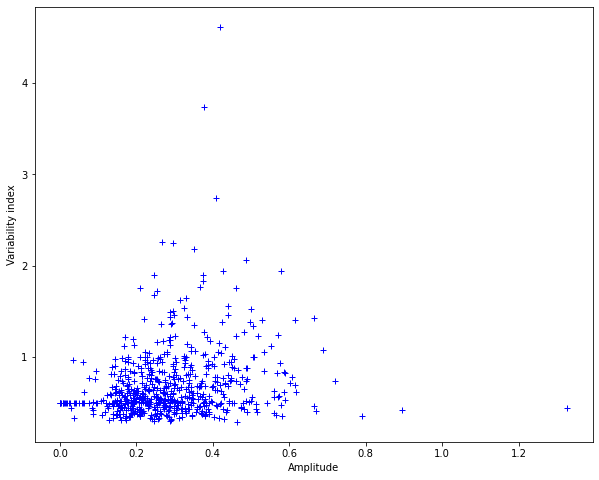

C:\Users\Jake\anaconda3\lib\site-packages\numpy\core\_asarray.py:85: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


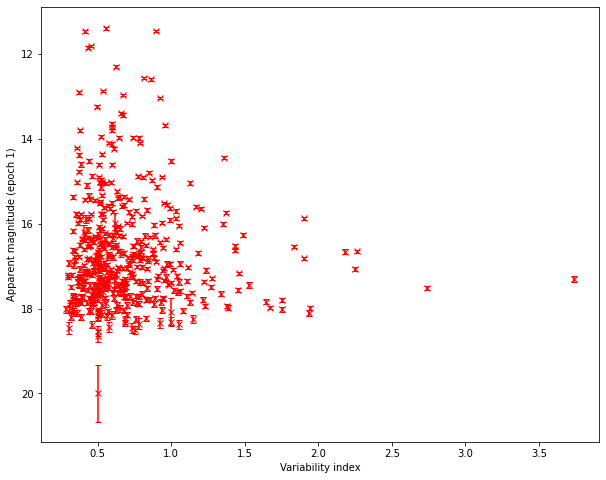

286


In [12]:
plt.plot(huge_table['amp'], huge_table['eta_inv'], 'b+')
plt.xlabel('Amplitude')
plt.ylabel('Variability index')
plt.gcf().set_size_inches(10, 8)
plt.show()

#plt.plot(huge_table['mag_e1'], huge_table['eta_inv'], 'b+')
plt.errorbar(huge_table['eta_inv'], huge_table['mag_e1'], yerr=huge_table['err_e1'], fmt='x', color='red', capsize=3, markersize=6)
plt.ylabel('Apparent magnitude (epoch 1)')
plt.xlabel('Variability index')
plt.gca().invert_yaxis()
plt.gcf().set_size_inches(10, 8)
plt.show()

print(huge_table['eta_inv'].argmax())

In [5]:
LC_time = []
for filename in glob.glob(base_dir+'*/IC4499__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/IC4499__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        print(filename)
        hdr = hdu_list[0].header
    
    LC_time.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
    
print((LC_time))

data/PAL5\PAL5__e1\PAL5__e1_3p6um.fits
data/PAL5\PAL5__e2\PAL5__e2_3p6um.fits
data/PAL5\PAL5__e3\PAL5__e3_3p6um.fits
data/PAL5\PAL5__e4\PAL5__e4_3p6um.fits
data/PAL5\PAL5__e5\PAL5__e5_3p6um.fits
data/PAL5\PAL5__e6\PAL5__e6_3p6um.fits
data/PAL5\PAL5__e7\PAL5__e7_3p6um.fits
data/PAL5\PAL5__e8\PAL5__e8_3p6um.fits
data/PAL5\PAL5__e9\PAL5__e9_3p6um.fits
data/PAL5\PAL5__e10\PAL5__e10_3p6um.fits
data/PAL5\PAL5__e11\PAL5__e11_3p6um.fits
data/PAL5\PAL5__e12\PAL5__e12_3p6um.fits
[56422.909763090276, 56422.98037792824, 56423.03359486111, 56423.096869479166, 56423.158750648145, 56423.225721724535, 56423.277202604164, 56423.34184263889, 56423.403988252314, 56423.45839726852, 56423.51922112268, 56423.588995798615]


### GLOESS running:

[56524.37243767361, 56524.434811921295, 56524.496870393516, 56524.55862994213, 56524.62487443287, 56524.677250127315, 56524.73901320602, 56524.802780798615, 56524.86136105324, 56524.921150208334, 56524.98415725694, 56525.04442045139]
RRab
Channel 1 ID:  555
[14.53963313178028, 14.51963399369297, 14.544863274126492, 14.531100738662882, 14.514565827679718, 14.550865977464616, 14.504542793396912, 14.44004881165462, 14.366859501470444, 99.0, 14.46001943314757, 14.528847749860129]
RRL5 ---- Period = 7.26 days
------------------------------------------------------
11 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 14.660    std dev = 0.240     amplitude = 1.084
Channels don't have the same number of measurements, so colour curve couldn't be plotted


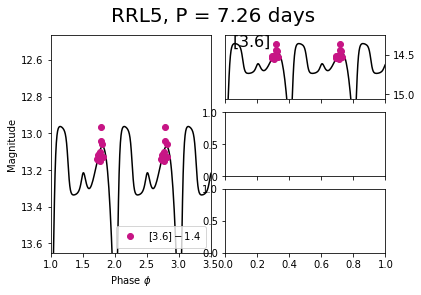

14.660212689483972 1.0838964204868944 nan nan


In [13]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um.pickle'
    load_name_normal = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'.pickle'
    save_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'
    load_name_normal = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    save_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
#pickle_in = open(load_name_ch2, 'rb')
#huge_table_ch2 = pickle.load(pickle_in)
pickle_in = open(load_name_normal, 'rb')
huge_table = pickle.load(pickle_in)


LC_time_gloess = []
for filename in glob.glob(base_dir+'*/IC4499__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/IC4499__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        hdr = hdu_list[0].header
    LC_time_gloess.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)
print(LC_time_gloess)




################ # note: 1,3 are only visible in channel 2
desired_star = 4
################
ch1_list = [0, 1, 2, 4]
ch2_list = [0, 1, 2, 3]

file_CC = 'data/reference/CVSGC_IC4499_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

'''if desired_star >= 5:
    ra_temp = df_CC['RA'][desired_star]
    dec_temp = df_CC['dec'][desired_star]
    #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
    c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
else:
    c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star])
print(c_CC)'''

c_CC = SkyCoord(df_CC['RA'][desired_star], df_CC['dec'][desired_star], frame='icrs', unit='deg')
c_comp_ch1 = SkyCoord(huge_table_ch1['RA']*u.degree, huge_table_ch1['dec']*u.degree)
#c_comp_ch2 = SkyCoord(huge_table_ch2['RA']*u.degree, huge_table_ch2['dec']*u.degree)

if df_CC['type'][desired_star] == 'RR0':
    P = df_CC['period_fund'][desired_star]
    print('RRab')
elif df_CC['type'][desired_star] == 'RR1':
    P = df_CC['period_FO'][desired_star]
    print('RRc')
elif df_CC['type'][desired_star] == 'RR01':
    P = df_CC['period_fund'][desired_star]
    print('RRd')
else:  # if not marked by christine as an RRL, we'll just take the fundamental period
    P = df_CC['period_fund'][desired_star]
    print('RRab')

#P = 0.7

temp = [i / P for i in LC_time_gloess]
phase = temp - np.floor(temp)

star_id_ch1, d2d_ch1, d3d_ch1 = c_CC.match_to_catalog_sky(c_comp_ch1)
#star_id_ch2, d2d_ch2, d3d_ch2 = c_CC.match_to_catalog_sky(c_comp_ch2)

if desired_star in ch1_list:
    print('Channel 1 ID: ', star_id_ch1)
#if desired_star in ch2_list:
#    print('Channel 2 ID: ', star_id_ch2)


#star_id_ch1 = 632
#star_id_ch2 = 658
#star_id_ch1 = 37
#star_id_ch2 = 60

huge_table_ch1_f = copy.copy(huge_table_ch1.filled(99))
#huge_table_ch2_f = copy.copy(huge_table_ch2.filled(99))

mags_ch1 = []
mags_ch2 = []
errs_ch1 = []
errs_ch2 = []
for j in range(1,13):
    if desired_star in ch1_list:
        mags_ch1.append(huge_table_ch1_f['mag_e'+str(j)][star_id_ch1])
        errs_ch1.append(huge_table_ch1_f['err_e'+str(j)][star_id_ch1])
    #if desired_star in ch2_list:
    #    mags_ch2.append(huge_table_ch2_f['mag_e'+str(j)][star_id_ch2])
    #    errs_ch2.append(huge_table_ch2_f['err_e'+str(j)][star_id_ch2])
        

### Masking out a specific data point (only use in emergencies, or the Science Police will get you):
# EPOCH number of bad point:
#remove_pls = 5
#mags_ch2[remove_pls-1] = 99
#print(mags_ch1)

###
        
# Since GLOESS already discards bunk magnitudes, I need to leave them in as 99
'''mags_ch1 = np.ma.array(mags_ch1)
mags_ch1 = np.ma.masked_where(mags_ch1 == 99, mags_ch1)
mags_ch2 = np.ma.array(mags_ch2)
mags_ch2 = np.ma.masked_where(mags_ch2 == 99, mags_ch2)
errs_ch1 = np.ma.array(errs_ch1)
errs_ch1 = np.ma.masked_where(errs_ch1 == 99, errs_ch1)
errs_ch2 = np.ma.array(errs_ch2)
errs_ch2 = np.ma.masked_where(errs_ch2 == 99, errs_ch2)'''  

print(mags_ch1)
#print(mags_ch2)

ch1_smooth = 0.25
ch2_smooth = 0.25

#mean_ch1, amp_ch1, mean_ch2, amp_ch2 = runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(desired_star+1), ch1_smooth, ch2_smooth, wantcolour='yes')
mean_ch1, amp_ch1, std_ch1, mean_ch2, amp_ch2, std_ch2 = jg.runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(desired_star+1), ch1_smooth, ch2_smooth, wantcolour='yes')

print(mean_ch1, amp_ch1, mean_ch2, amp_ch2)

### Running GLOESS over all RRL:

Gaia DR2 ID: 2814894112367752192
RRab
Channel 1 ID:  561
Channel 1 mags:  [16.33076283093409, 16.207756560274152, 16.19861909023209, 16.2679385119346, 16.25594548007045, 16.339967555343666, 16.45295911464851, 16.531741330561424, 16.52561882562927, 16.448570080485883, 16.43484535955322, 16.4792095999772] 

RRL1 ---- Period = 0.5382 days
------------------------------------------------------
12 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 16.379    std dev = 0.083     amplitude = 0.249
Channels don't have the same number of measurements, so colour curve couldn't be plotted


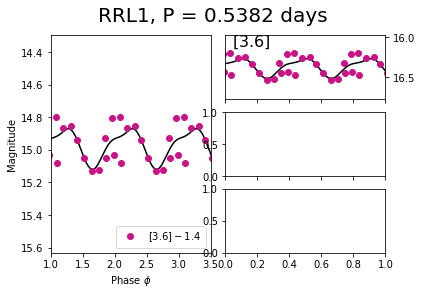




Gaia DR2 ID: 2814893910504602624
RRab
Channel 1 ID:  475
Channel 1 mags:  [16.2543251375728, 16.29769575451573, 16.149298238892484, 16.137335693204484, 16.07927811574676, 16.096297709040606, 16.151367239203143, 16.193821190907034, 16.240172172952697, 16.256677471364835, 16.32222495205589, 16.339237081574836] 

RRL2 ---- Period = 0.5971 days
------------------------------------------------------
12 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 16.193    std dev = 0.071     amplitude = 0.207
Channels don't have the same number of measurements, so colour curve couldn't be plotted


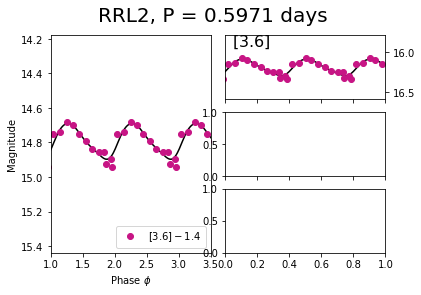




Gaia DR2 ID: 2814893910504601600
RRab
Channel 1 ID:  499
Channel 1 mags:  [16.266617080928928, 16.40336531909664, 16.255619451946878, 16.213577055985635, 16.172122852508906, 16.13067575020504, 16.20276924574487, 16.248375444946753, 16.285974340725183, 16.43195094119917, 16.592646504406478, 16.5239653644862] 

RRL3 ---- Period = 0.5782 days
------------------------------------------------------
12 0


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<[3.6]> = 16.281    std dev = 0.100     amplitude = 0.295
Channels don't have the same number of measurements, so colour curve couldn't be plotted


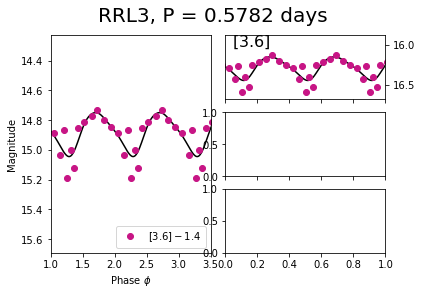

,ID,RA,dec,units,period_fund,period_FO,mean_mag_CC,amplitude,colour,type,gaia_ID,gaia_ID_1,gaia_ID_2,comments,mean_mag_ch1,mean_std_ch1,mean_photerr_ch1,period_used,period_PL,A_ch1
0,1,23h06m41.53s,12d46m58.9s,R0,0.5382,NaN,17.886,0.80,V,RR0,2814894112367752192,2814894112,367752192,NaN,16.359301,0.082745,0.037728,0.5382,0.5382,0.02
1,2,23h06m44.47s,12d46m16.1s,R0,0.5971,NaN,17.819,0.79,V,RR0,2814893910504602624,2814893910,504602624,only 90% sure on this gaia id,16.173061,0.071170,0.033696,0.5971,0.5971,0.02
2,3,23h06m43.14s,12d46m47.8s,R0,0.5782,NaN,17.766,0.83,V,RR0,2814893910504601600,2814893910,504601600,NaN,16.261237,0.100364,0.033847,0.5782,0.5782,0.02
3,4,23h06m48.83s,12d41m22.3s,R0,0.5751,NaN,17.886,0.52,V,RR0,2811888666052959232,2811888666,52959232,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,23h06m37.28s,12d49m27.5s,R0,7.2600,NaN,17.029,0.40,V,SR?,2814897312118708992,2814897312,118708992,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um.pickle'
    load_name_normal = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'.pickle'
    save_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'
    load_name_normal = 'phot_tables/IC4499/huge_table_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'
    save_name = 'phot_tables/IC4499/huge_table_var_'+method+'_'+channel+'_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
#pickle_in = open(load_name_ch2, 'rb')
#huge_table_ch2 = pickle.load(pickle_in)
pickle_in = open(load_name_normal, 'rb')
huge_table = pickle.load(pickle_in)


LC_time_gloess = []
for filename in glob.glob(base_dir+'*/IC4499__e[0-9]_'+channel+'.fits', recursive=True) + glob.glob(base_dir+'*/IC4499__e[0-9][0-9]_'+channel+'.fits', recursive=True):
    with fits.open(filename) as hdu_list:        
        hdr = hdu_list[0].header
    LC_time_gloess.append(Time(hdr['DATE_OBS'], format='isot', scale='utc').mjd)


ch1_smooth = 0.25
ch2_smooth = 0.25

means_ch1 = []
means_ch2 = []
stds_ch1 = []
stds_ch2 = []
photerr_mean_ch1 = []
photerr_mean_ch2 = []
amps_ch1 = []
amps_ch2 = []
periods = []
periods_PL = []
A_ch1 = []
A_ch2 = []

file_CC = 'data/reference/CVSGC_IC4499_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

ch1_list = [0, 1, 2, 4]
ch2_list = [0, 1, 2, 3]

for star in range(len(df_CC)):
    
    if star == 3 or star == 4:  # star 3 isn't in channel 1, and star 4 probably isn't an RRL, so we skip
        means_ch1.append(float('NaN'))
        means_ch2.append(float('NaN'))
        stds_ch1.append(float('NaN'))
        stds_ch2.append(float('NaN'))
        photerr_mean_ch1.append(float('NaN'))
        photerr_mean_ch2.append(float('NaN'))
        periods.append(float('NaN'))
        periods_PL.append(float('NaN'))
        A_ch1.append(float('NaN'))
        A_ch2.append(float('NaN'))
        continue
    
    if df_CC['gaia_ID'][star] != 0:
        #print('Gaia DR2 ID: {:.0f}'.format(df_CC['gaia_ID'][star]))
        id1 = df_CC['gaia_ID_1'][star]
        id2 = df_CC['gaia_ID_2'][star]
        gaia_id = int(str(int(id1)) + str(int(id2)))  # this method is so fucked but it's the only way to avoid float precision errors :)))))
        print('Gaia DR2 ID:', gaia_id)

    '''if star >= 5:
        ra_temp = df_CC['RA'][star]
        dec_temp = df_CC['dec'][star]
        #c_CC = SkyCoord(ra_temp*u.degree, dec_temp*u.degree)
        c_CC = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')
    else:
        c_CC = SkyCoord(df_CC['RA'][star], df_CC['dec'][star], frame='icrs', unit='deg')
    #print(c_CC)'''
    
    c_CC = SkyCoord(df_CC['RA'][star], df_CC['dec'][star], frame='icrs', unit='deg')
    c_comp_ch1 = SkyCoord(huge_table_ch1['RA']*u.degree, huge_table_ch1['dec']*u.degree)
    #c_comp_ch2 = SkyCoord(huge_table_ch2['RA']*u.degree, huge_table_ch2['dec']*u.degree)

    if df_CC['type'][star] == 'RR0':
        P = df_CC['period_fund'][star]
        P_PL = P
        print('RRab')
    elif df_CC['type'][star] == 'RR1':
        P = df_CC['period_FO'][star]
        P_PL = P * 10**0.127
        print(P, P_PL)
        print('RRc')
    elif df_CC['type'][star] == 'RR01':
        P = df_CC['period_FO'][star]
        P_PL = P * 10**0.127
        print('RRd')
    #elif star == 4:
    #    P = 0.7
    #    P_PL = P
    #    print('SR? (weird star 5)')
    else:  # if not marked by christine as an RRL, we'll just take the fundamental period
        P = df_CC['period_fund'][star]
        P_PL = P
        print('RRab')
    
    periods.append(P)
    periods_PL.append(P_PL)
    temp = [i / P for i in LC_time_gloess]
    phase = temp - np.floor(temp)

    star_id_ch1, d2d_ch1, d3d_ch1 = c_CC.match_to_catalog_sky(c_comp_ch1)
    #star_id_ch2, d2d_ch2, d3d_ch2 = c_CC.match_to_catalog_sky(c_comp_ch2)

    if star in ch1_list:
        print('Channel 1 ID: ', star_id_ch1)
    #if star in ch2_list:
    #    print('Channel 2 ID: ', star_id_ch2)

    huge_table_ch1_f = copy.copy(huge_table_ch1.filled(99))
    #huge_table_ch2_f = copy.copy(huge_table_ch2.filled(99))

    mags_ch1 = []
    mags_ch2 = []
    errs_ch1 = []
    errs_ch2 = []
    for j in range(1,13):
        if star in ch1_list:
            mags_ch1.append(huge_table_ch1_f['mag_e'+str(j)][star_id_ch1])
            errs_ch1.append(huge_table_ch1_f['err_e'+str(j)][star_id_ch1])
        #if star in ch2_list:
        #    mags_ch2.append(huge_table_ch2_f['mag_e'+str(j)][star_id_ch2])
        #    errs_ch2.append(huge_table_ch2_f['err_e'+str(j)][star_id_ch2])


    ### Masking out a specific data point (only use in emergencies, or the Science Police will get you):
    # EPOCH number of bad point:
    #remove_pls = 5
    #mags_ch2[remove_pls-1] = 99
    #print(mags_ch1)

    ###

    # Since GLOESS already discards bunk magnitudes, I need to leave them in as 99

    print('Channel 1 mags: ', mags_ch1, '\n')
    #print('Channel 2 mags: ', mags_ch2, '\n')
    
    ###   EXTINCTION   ###
    
    ex_table = IrsaDust.get_extinction_table(c_CC)
    ex_table.add_index('Filter_name')
    idx_ch1 = ex_table.loc_indices[['IRAC-1']]
    idx_ch2 = ex_table.loc_indices[['IRAC-2']]
    ext_ch1 = ex_table['A_SandF'][idx_ch1]
    ext_ch2 = ex_table['A_SandF'][idx_ch2]
    A_ch1.append(ext_ch1)
    #A_ch2.append(ext_ch2)

    #mean_ch1, amp_ch1, std_ch1, mean_ch2, amp_ch2, std_ch2 = runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(star+1), ch1_smooth, ch2_smooth, wantcolour='yes')
    mean_ch1, amp_ch1, std_ch1, mean_ch2, amp_ch2, std_ch2 = jg.runGloess(mags_ch1, errs_ch1, mags_ch2, errs_ch2, LC_time_gloess, P, 'RRL'+str(star+1), ch1_smooth, ch2_smooth, wantcolour='yes')
    
    # Correcting for extinction:
    mean_ch1 -= ext_ch1
    #mean_ch2 -= ext_ch2
    
    means_ch1.append(mean_ch1)
    #means_ch2.append(mean_ch2)
    stds_ch1.append(std_ch1)
    #stds_ch2.append(std_ch2)
    amps_ch1.append(amp_ch1)
    #amps_ch2.append(amp_ch2)
    
    ###   ERROR IN MEAN MAGNITUDE   ###
    
    '''if star in ch1_list:
        ch1_temp = [(1. / e**2) for e in errs_ch1]
        err_ch1 = np.sqrt(1. / sum(ch1_temp))
        err_mean_ch1.append(err_ch1)
    if star in ch2_list:
        ch2_temp = [(1. / e**2) for e in errs_ch2]
        err_ch2 = np.sqrt(1. / sum(ch2_temp))
        err_mean_ch2.append(err_ch2)'''
    
    '''ch1_temp = [(1. / e**2) for e in errs_ch1]
    #ch2_temp = [(1. / e**2) for e in errs_ch2]
    
    if ch1_temp:
        photerr_ch1 = np.sqrt(1. / sum(ch1_temp))
    else:
        photerr_ch1 = float('NaN')
    #if ch2_temp:
    #    photerr_ch2 = np.sqrt(1. / sum(ch2_temp))
    #else:
    #    photerr_ch2 = float('NaN')'''
    
    errs_ch1 = np.ma.masked_equal(errs_ch1, 99)
    errs_ch2 = np.ma.masked_equal(errs_ch2, 99)
    
    if len(errs_ch1) != 0:
        photerr_ch1 = sum(errs_ch1.compressed()) / len(errs_ch1.compressed())
    else:
        photerr_ch1 = float('NaN')
    if len(errs_ch2) != 0:
        photerr_ch2 = sum(errs_ch2.compressed()) / len(errs_ch2.compressed())
    else:
        photerr_ch2 = float('NaN')
    
    photerr_mean_ch1.append(photerr_ch1)
    #photerr_mean_ch2.append(photerr_ch2)
    
    print('\n\n')
    
df_CC['mean_mag_ch1'] = means_ch1
#df_CC['mean_mag_ch2'] = means_ch2
df_CC['mean_std_ch1'] = stds_ch1
#df_CC['mean_std_ch2'] = stds_ch2
df_CC['mean_photerr_ch1'] = photerr_mean_ch1
#df_CC['mean_photerr_ch2'] = photerr_mean_ch2
df_CC['period_used'] = periods
df_CC['period_PL'] = periods_PL
df_CC['A_ch1'] = A_ch1
#df_CC['A_ch2'] = A_ch2

df_CC

### Plotting PL relation:

In [27]:
print(np.sqrt(err_int_ch1**2 + aerr_ch1**2))
print(np.sqrt(aerr_ch1**2 + berr_ch1**2 + disp_ch1**2))

0.03000669339000035
0.43520110293977887


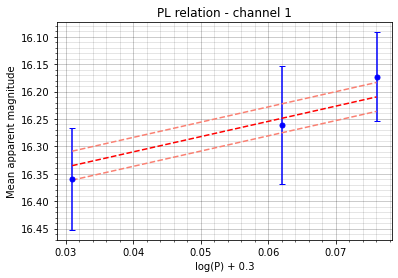

Intercept, a: 16.421204
Error in a:    0.018664
Std. dev.:     0.026395

Distance modulus: 16.82120 ± 0.03533 (random) ± 0.11788 (systematic)
Distance: 23.13 ± 0.38 (random) ± 1.26 (systematic) kpc




"popt, pcov = curve_fit(PL_fit_ch2, periods_ch2.compressed(), means_ch2.compressed())\nintercept_ch2 = popt[0]\nerr_int_ch2 = np.sqrt(pcov[0][0])\n\ndevs_ch2 = [(m - PL_fit_ch2(p, intercept_ch2))**2 for m, p in zip(means_ch2.compressed(), periods_ch2.compressed())]\nstd_ch2 = np.sqrt(np.mean(devs_ch2))\n\nplt.errorbar(np.log10(periods_ch2.compressed()) + 0.3, means_ch2.compressed(), yerr=err_mean_ch2.compressed(), fmt='o', color='blue', capsize=3, markersize=5)\nplt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2), 'r--')\nplt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 + std_ch2), c='salmon', ls='--')\nplt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 - std_ch2), c='salmon', ls='--')\nplt.minorticks_on()\nplt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')\nplt.grid(b=True

In [17]:
a_ch1 = -0.40  # Neeley 2019 intercept for absolute mag, M
a_ch2 = -0.41
b_ch1 = -2.78
b_ch2 = -2.83

aerr_ch1 = 0.03
aerr_ch2 = 0.03
berr_ch1 = 0.38
berr_ch2 = 0.39
disp_ch1 = 0.21
disp_ch2 = 0.21

def PL_fit_ch1(P, a):  # note this a is DIFFERENT to a_ch1 above; this a is the variable being fit
    return a + b_ch1 * (np.log10(P) + 0.3)
def PL_fit_ch2(P, a):
    return a + b_ch2 * (np.log10(P) + 0.3)

means_ch1 = np.ma.masked_invalid(means_ch1)
#means_ch2 = np.ma.masked_invalid(means_ch2)
photerr_mean_ch1 = np.ma.masked_array(photerr_mean_ch1, means_ch1.mask)
#photerr_mean_ch2 = np.ma.masked_array(photerr_mean_ch2, means_ch2.mask)
stds_ch1 = np.ma.masked_array(stds_ch1, means_ch1.mask)
#stds_ch2 = np.ma.masked_array(stds_ch2, means_ch2.mask)
A_ch1 = np.ma.masked_array(A_ch1, means_ch1.mask)
#A_ch2 = np.ma.masked_array(A_ch2, means_ch2.mask)
periods_ch1 = np.ma.masked_array(df_CC['period_PL'], means_ch1.mask)
#periods_ch2 = np.ma.masked_array(df_CC['period_PL'], means_ch2.mask)

err_mean_ch1 = np.sqrt(photerr_mean_ch1**2 + stds_ch1**2 + A_ch1**2)
#err_mean_ch2 = np.sqrt(photerr_mean_ch2**2 + stds_ch2**2 + A_ch2**2)

#print(photerr_mean_ch1)
#print(stds_ch1)
#print(err_mean_ch1)

#########

popt, pcov = curve_fit(PL_fit_ch1, periods_ch1.compressed(), means_ch1.compressed())
intercept_ch1 = popt[0]
err_int_ch1 = np.sqrt(pcov[0][0])

devs_ch1 = [(m - PL_fit_ch1(p, intercept_ch1))**2 for m, p in zip(means_ch1.compressed(), periods_ch1.compressed())]
std_ch1 = np.sqrt(np.mean(devs_ch1))

plt.errorbar(np.log10(periods_ch1.compressed()) + 0.3, means_ch1.compressed(), yerr=err_mean_ch1.compressed(), fmt='o', color='blue', capsize=3, markersize=5)
plt.plot(np.log10(sorted(periods_ch1.compressed())) + 0.3, PL_fit_ch1(sorted(periods_ch1.compressed()), intercept_ch1), 'r--')
plt.plot(np.log10(sorted(periods_ch1.compressed())) + 0.3, PL_fit_ch1(sorted(periods_ch1.compressed()), intercept_ch1 + std_ch1), c='salmon', ls='--')
plt.plot(np.log10(sorted(periods_ch1.compressed())) + 0.3, PL_fit_ch1(sorted(periods_ch1.compressed()), intercept_ch1 - std_ch1), c='salmon', ls='--')
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gca().invert_yaxis()
plt.xlabel('log(P) + 0.3')
plt.ylabel('Mean apparent magnitude')
plt.title('PL relation - channel 1')
plt.show()
print('Intercept, a: {0:.6f}\nError in a:    {1:.6f}\nStd. dev.:     {2:.6f}\n'.format(intercept_ch1, err_int_ch1, std_ch1))

distmod_ch1 = intercept_ch1 - a_ch1
dist_ch1 = 10 ** ((distmod_ch1 / 5.) + 1.)

distmod_randerr_ch1 = np.sqrt(err_int_ch1**2 + aerr_ch1**2)
dist_randerr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * distmod_randerr_ch1)

distmod_syserr_ch1 = np.sqrt(aerr_ch1**2 + (0.3**2 * berr_ch1**2))
dist_syserr_ch1 = abs(dist_ch1) * abs(0.2 * np.log(10.) * distmod_syserr_ch1)  # 0.3^2 from PL equation

print('Distance modulus: {0:.5f} ± {1:.5f} (random) ± {2:.5f} (systematic)'.format(distmod_ch1, distmod_randerr_ch1, distmod_syserr_ch1))
print('Distance: {0:.2f} ± {1:.2f} (random) ± {2:.2f} (systematic) kpc\n\n'.format(dist_ch1/1000, dist_randerr_ch1/1000, dist_syserr_ch1/1000))


#########

'''popt, pcov = curve_fit(PL_fit_ch2, periods_ch2.compressed(), means_ch2.compressed())
intercept_ch2 = popt[0]
err_int_ch2 = np.sqrt(pcov[0][0])

devs_ch2 = [(m - PL_fit_ch2(p, intercept_ch2))**2 for m, p in zip(means_ch2.compressed(), periods_ch2.compressed())]
std_ch2 = np.sqrt(np.mean(devs_ch2))

plt.errorbar(np.log10(periods_ch2.compressed()) + 0.3, means_ch2.compressed(), yerr=err_mean_ch2.compressed(), fmt='o', color='blue', capsize=3, markersize=5)
plt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2), 'r--')
plt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 + std_ch2), c='salmon', ls='--')
plt.plot(np.log10(sorted(periods_ch2.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2.compressed()), intercept_ch2 - std_ch2), c='salmon', ls='--')
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gca().invert_yaxis()
plt.xlabel('log(P) + 0.3')
plt.ylabel('Mean apparent magnitude')
plt.title('PL relation - channel 2')
plt.show()
print('Intercept, a: {0:.6f}\nError in a:    {1:.6f}\nStd. dev.:     {2:.6f}\n'.format(intercept_ch2, err_int_ch2, std_ch2))

distmod_ch2 = intercept_ch2 - a_ch2
dist_ch2 = 10 ** ((distmod_ch2 / 5.) + 1.)

distmod_randerr_ch2 = np.sqrt(err_int_ch2**2 + aerr_ch2**2)
dist_randerr_ch2 = abs(dist_ch2) * abs(0.2 * np.log(10.) * distmod_randerr_ch2)

distmod_syserr_ch2 = np.sqrt(aerr_ch2**2 + (0.3**2 * berr_ch2**2))
dist_syserr_ch2 = abs(dist_ch2) * abs(0.2 * np.log(10.) * distmod_syserr_ch2)  # 0.3^2 from PL equation

print('Distance modulus: {0:.5f} ± {1:.5f} (random) ± {2:.5f} (systematic)'.format(distmod_ch2, distmod_randerr_ch2, distmod_syserr_ch2))
print('Distance: {0:.2f} ± {1:.2f} (random) ± {2:.2f} (systematic) kpc'.format(dist_ch2/1000, dist_randerr_ch2/1000, dist_syserr_ch2/1000))


#########

# Plotting only channel 2 stars also visible in channel 1:
means_ch2_1 = np.ma.masked_array(means_ch2, means_ch1.mask)
photerr_mean_ch2_1 = np.ma.masked_array(photerr_mean_ch2, means_ch1.mask)
stds_ch2_1 = np.ma.masked_array(stds_ch2, means_ch1.mask)
err_mean_ch2_1 = np.ma.masked_array(err_mean_ch2, means_ch1.mask)
periods_ch2_1 = np.ma.masked_array(periods_ch2, means_ch1.mask)

popt, pcov = curve_fit(PL_fit_ch2, periods_ch2_1.compressed(), means_ch2_1.compressed())
intercept_ch2_1 = popt[0]
err_int_ch2_1 = np.sqrt(pcov[0][0])

devs_ch2_1 = [(m - PL_fit_ch2(p, intercept_ch2_1))**2 for m, p in zip(means_ch2_1.compressed(), periods_ch2_1.compressed())]
std_ch2_1 = np.sqrt(np.mean(devs_ch2_1))

plt.errorbar(np.log10(periods_ch2_1.compressed()) + 0.3, means_ch2_1.compressed(), yerr=err_mean_ch2_1.compressed(), fmt='o', color='blue', capsize=3, markersize=5)
plt.plot(np.log10(sorted(periods_ch2_1.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2_1.compressed()), intercept_ch2_1), 'r--')
plt.plot(np.log10(sorted(periods_ch2_1.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2_1.compressed()), intercept_ch2_1 + std_ch2_1), c='salmon', ls='--')
plt.plot(np.log10(sorted(periods_ch2_1.compressed())) + 0.3, PL_fit_ch2(sorted(periods_ch2_1.compressed()), intercept_ch2_1 - std_ch2_1), c='salmon', ls='--')
plt.minorticks_on()
plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
plt.gca().invert_yaxis()
plt.xlabel('log(P) + 0.3')
plt.ylabel('Mean apparent magnitude')
plt.title('PL relation - channel 2 (same stars as in channel 1)')
plt.show()
print('Intercept, a: {0:.6f}\nError in a:    {1:.6f}\nStd. dev.:     {2:.6f}\n'.format(intercept_ch2_1, err_int_ch2_1, std_ch2_1))

distmod_ch2_1 = intercept_ch2_1 - a_ch2
dist_ch2_1 = 10 ** ((distmod_ch2_1 / 5.) + 1.)

distmod_randerr_ch2_1 = np.sqrt(err_int_ch2_1**2 + aerr_ch2**2)
dist_randerr_ch2_1 = abs(dist_ch2_1) * abs(0.2 * np.log(10.) * distmod_randerr_ch2_1)

distmod_syserr_ch2_1 = np.sqrt(aerr_ch2**2 + (0.3**2 * berr_ch2**2))
dist_syserr_ch2_1 = abs(dist_ch2_1) * abs(0.2 * np.log(10.) * distmod_syserr_ch2_1)  # 0.3^2 from PL equation

print('Distance modulus: {0:.5f} ± {1:.5f} (random) ± {2:.5f} (systematic)'.format(distmod_ch2_1, distmod_randerr_ch2_1, distmod_syserr_ch2_1))
print('Distance: {0:.2f} ± {1:.2f} (random) ± {2:.2f} (systematic) kpc'.format(dist_ch2_1/1000, dist_randerr_ch2_1/1000, dist_syserr_ch2_1/1000))'''


### Other bits 'n bobs (not really being used):

In [49]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
pickle_in = open(load_name_ch2, 'rb')
huge_table_ch2 = pickle.load(pickle_in)

maxRA = max(max(huge_table_ch1['RA']), max(huge_table_ch2['RA']))
minRA = min(min(huge_table_ch1['RA']), min(huge_table_ch2['RA']))
maxdec = max(max(huge_table_ch1['dec']), max(huge_table_ch2['dec']))
mindec = min(min(huge_table_ch1['dec']), min(huge_table_ch2['dec']))

cmax = SkyCoord(maxRA, maxdec, frame='icrs', unit='deg')
cmin = SkyCoord(minRA, mindec, frame='icrs', unit='deg')

print(cmax.ra.hour)
print(cmin.ra.hour)
print(cmax.dec.deg)
print(cmin.dec.deg)
print('')
print(cmax.ra.hms)
print(cmin.ra.hms)
print(cmax.dec.dms)
print(cmin.dec.dms)
print('')
print('Max RA: ',cmax.ra.deg)
print('Min RA: ',cmin.ra.deg)
print('Max dec:',cmax.dec.deg)
print('Min dec:',cmin.dec.deg)

FileNotFoundError: [Errno 2] No such file or directory: 'phot_tables/PAL13/huge_table_PSF_4p5um_model_emaster.pickle'

i:  0
Gaia ID:  4418920808077110784
Other ID: V5 (K62)
Period:   0.337934
        ra                 dec         
------------------ --------------------
228.99266625761803 -0.09659804838365565
Star match:  640
   RA        dec     
-------- ------------
228.9927 -0.096493326


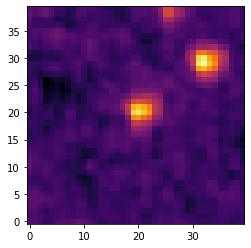

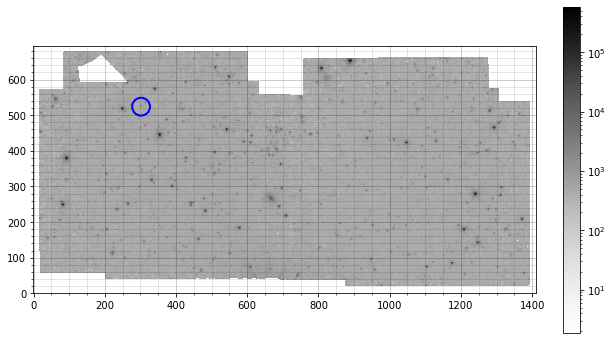



i:  1
Gaia ID:  4418920846732620032
Other ID: --
Period:   0.643239
        ra                 dec         
------------------ --------------------
228.99634825110095 -0.08977613143985393
Star match:  615
    RA        dec     
--------- ------------
228.99637 -0.089710531


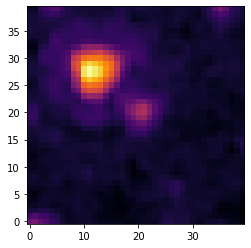

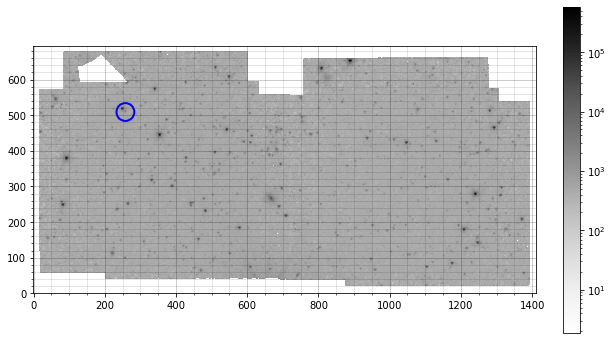



i:  2
Gaia ID:  4418914863842345856
Other ID: V1 (K62)
Period:   0.293229
        ra                 dec         
------------------ --------------------
228.98840114088054 -0.11479928258025933
Star match:  658
    RA        dec    
--------- -----------
228.98847 -0.11472219


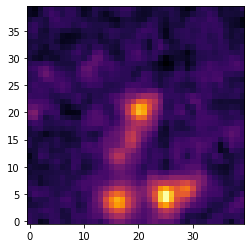

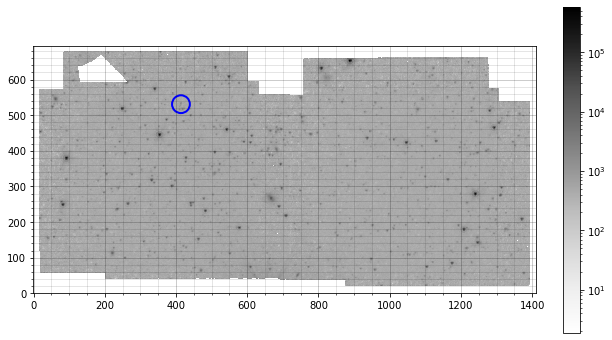



i:  3
Gaia ID:  4418726027016125056
Other ID: V3 (K62)
Period:   0.329948
        ra                 dec         
------------------ --------------------
229.05318546815684 -0.16753341271842292
Star match:  60
    RA        dec    
--------- -----------
229.05323 -0.16744948


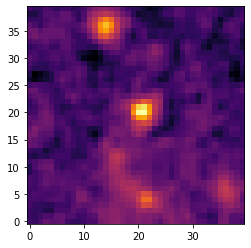

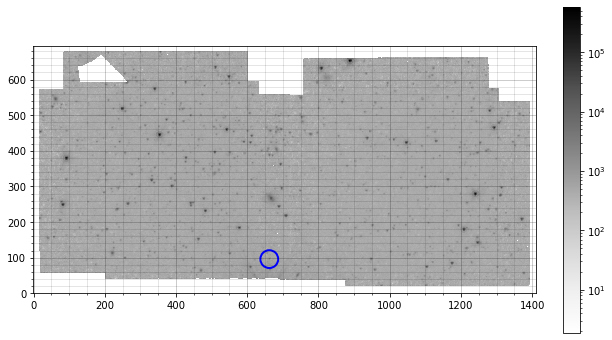



i:  4
Gaia ID:  4418725889577171328
Other ID: V4 (K62)
Period:   0.286366
        ra                 dec        
------------------ -------------------
229.02409317322295 -0.1868582773571904
Star match:  255
    RA        dec    
--------- -----------
229.02412 -0.18677468


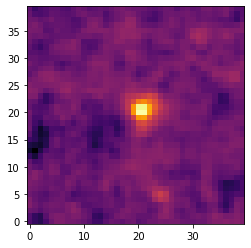

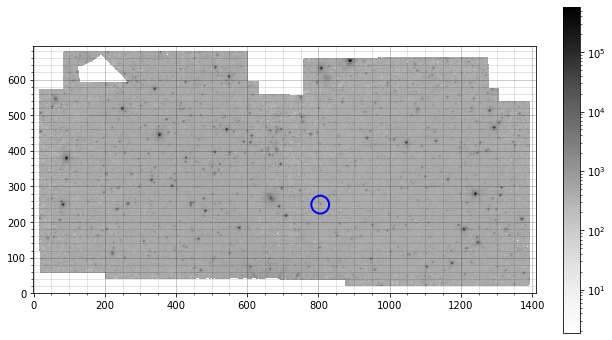



i:  5
Gaia ID:  4418731829516302848
Other ID: --
Period:   0.28164
        ra                 dec        
------------------ -------------------
229.09705423020364 -0.1419234982327973
Star out of our range


i:  6
Gaia ID:  4418913218870688768
Other ID: V2 (K62)
Period:   0.332473
        ra                 dec         
------------------ --------------------
228.99144962264384 -0.18985356481473498
Star match:  506
    RA       dec    
--------- ----------
228.99149 -0.1897417


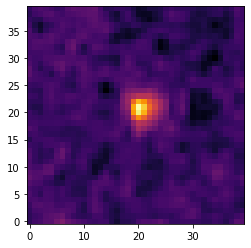

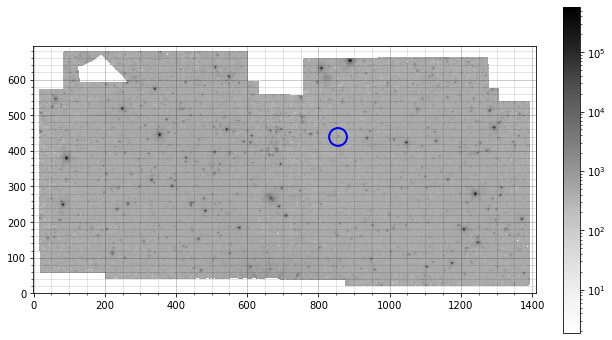



i:  7
Gaia ID:  4418734165978521728
Other ID: --
Period:   0.380859
        ra                 dec         
------------------ --------------------
229.14462533811073 -0.07361857966701019
Star out of our range


i:  8
Gaia ID:  4418724034151291776
Other ID: 403 (V04)
Period:   0.551705
        ra                dec         
----------------- --------------------
229.0395752980474 -0.27315259808741965
Star match:  42
    RA        dec    
--------- -----------
229.03964 -0.27308442


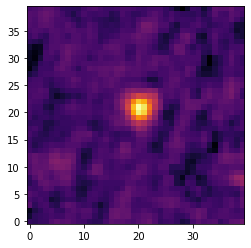

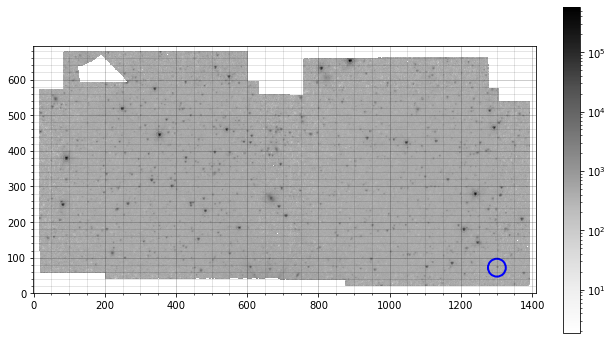



i:  9
Gaia ID:  4418732791593809152
Other ID: 405 (V04)
Period:   0.32967
Star not found in Gaia table




In [185]:
pw_path = 'data/reference/price_whelan_data/RRLwithprobthin.fits'
hdultemp = fits.open(pw_path)
data0 = hdultemp[0].header
data1 = hdultemp[1].data
#data1.shape
tbl = Table.read(pw_path)
#tbl.show_in_notebook()
#print('{:.0f}'.format(tbl['source_id'][0]))
tbl.add_index('designation')
idxyay = tbl.loc['Gaia DR2 4418914863842345856']
#idxyay
#tbl.loc[4418914863842345856]

pwtbl_path = 'data/reference/price_whelan_data/pw-table2.txt'
pwtbl = Table.read(pwtbl_path, format='ascii.csv')
#pwtbl

gaia_path = 'data/reference/IC4499_Gaia_radius_11_arcmin.csv'
gaiatbl = Table.read(gaia_path, format='ascii.csv')
gaiatbl.add_index('source_id')

c_comp = SkyCoord(huge_table['RA'], huge_table['dec'], frame='icrs', unit='deg')

for i in range(len(pwtbl)):
    print('i: ', i)
    
    hereiam = pwtbl['source_id'][i]
    print('Gaia ID: ', hereiam)
    print('Other ID:', pwtbl['other_id'][i])
    print('Period:  ', pwtbl['period'][i])
    try:
        hola = gaiatbl.loc[hereiam]
        print(hola['ra', 'dec'])
     
        ra_temp = hola['ra']
        dec_temp = hola['dec']

        if ra_temp >= cmin.ra.deg and ra_temp <= cmax.ra.deg and dec_temp >= cmin.dec.deg and dec_temp <= cmax.dec.deg:
            c_temp = SkyCoord(ra_temp, dec_temp, frame='icrs', unit='deg')

            star_match, d2d, d3d = c_temp.match_to_catalog_sky(c_comp)
            print('Star match: ', star_match)

            print(huge_table['RA', 'dec'][star_match])

            star_r = 20
            star_x = int(huge_table['x_0'][star_match])
            star_y = int(huge_table['y_0'][star_match])
            star_ap = CircularAperture((star_x, star_y), r=25.)

            region = data_m[star_y-star_r:star_y+star_r, star_x-star_r:star_x+star_r]
            plt.imshow(region, cmap='inferno', origin='lower', norm=LogNorm(), interpolation='nearest', aspect='equal')
            #star_ap.plot(color='white')
            plt.show()

            plt.imshow(data_m, cmap='Greys', origin='lower', norm=LogNorm(), interpolation='nearest')
            star_ap.plot(color='blue', lw=2.)
            plt.colorbar(fraction = 0.05)
            plt.minorticks_on()
            plt.grid(b=True, which='major', lw=.5, alpha=.4, color='black')
            plt.grid(b=True, which='minor', lw=.5, alpha=.2, color='black')
            plt.gcf().set_size_inches(10, 6)
            plt.show()
        else:
            print('Star out of our range')
        
    except KeyError:
        hola = 'Star not found in Gaia table'
        print(hola)
        
    
    #hello = tbl.loc['Gaia DR2 '+hereiam]
    #print(hello['designation'])
    
    print('\n')

In [139]:
pwtbl_path = 'data/reference/price_whelan_data/pw-table2.txt'
pwtbl = Table.read(pwtbl_path, format='ascii.csv')
pwtbl

source_id,other_id,period,amp-g,type,D,member_prob,separation
str19,str9,float64,float64,str4,float64,float64,float64
4418920808077110784,V5 (K62),0.337934,0.46,RRc,20.7,1.0,2.0
4418920846732620032,--,0.643239,0.27,RRab,21.7,0.99,2.0
4418914863842345856,V1 (K62),0.293229,0.56,RRc,20.4,0.95,2.0
4418726027016125056,V3 (K62),0.329948,0.51,RRc,20.7,1.0,3.9
4418725889577171328,V4 (K62),0.286366,0.59,RRc,20.3,1.0,4.5
4418731829516302848,--,0.28164,0.3,RRc,18.1,0.65,4.9
4418913218870688768,V2 (K62),0.332473,0.4,RRc,20.3,1.0,5.1
4418734165978521728,--,0.380859,0.52,RRc,22.8,0.91,7.7
4418724034151291776,403 (V04),0.551705,1.14,RRab,21.2,1.0,9.8


In [23]:
file_CC = 'data/reference/CVSGC_IC4499_readable.txt'
df_CC = pd.read_csv(file_CC, sep=',', header=0)

C = SkyCoord(df_CC.RA[0], df_CC.dec[0], frame='icrs', unit='deg')
print(C)
table = IrsaDust.get_extinction_table(C)
table[19:21]

<SkyCoord (ICRS): (ra, dec) in deg
    (228.98825, -0.11480556)>


Filter_name,LamEff,A_over_E_B_V_SandF,A_SandF,A_over_E_B_V_SFD,A_SFD
,micron,,mag,,mag
str8,float64,float64,float64,float64,float64
IRAC-1,3.52,0.178,0.01,0.22,0.012
IRAC-2,4.46,0.148,0.008,0.183,0.01


### Temporarily keeping GLOESS code here so it's easier to edit:

In [10]:
### Script generously provided by Vicky Scowcroft ###
### Converted to Python 3.x and edited by Jake Bird, December 1 2020 ###




import numpy as np
import matplotlib.pyplot as plt
import sys
import gloess_fits as gf
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
#matplotlib.rc('text',usetex=True)
from matplotlib import rcParams
#rcParams['font.family'] = 'serif'
#rcParams['font.serif'] = ['Garamond']

def runGloess(mag_ch1, err_ch1, mag_ch2, err_ch2, LC_time, period, starname, xir1, xir2, wantcolour):

    ## Converting the gloess fourtran/pgplot code to python/matplotlib
    ## June 15 2012

    ## Version 1.0
    ## last edit - June 19 2012

    ## Next thing to add:
    ##Print fits to an output text file


    ## Open the input data file and read the info

    #input = sys.argv[1]
    #input = 'c:/Users/Jake/MPhys-code/MPhys-RRL/test_photometry/gloess-master/RRLyr.gloess_in'
    #input = 'c:/Users/Jake/MPhys-code/MPhys-RRL/test_photometry/gloess-master/UVOct.gloess_in'
    #counter = 0

    ## Want to know whether the IRAC data is phased or not. 
    ## If it is phased, must reduce the uncertainty by another factor of sqrt(N)

    #nir1 = sum(ir1<50)
    #nir2= sum(ir2<50)

    phased = 0   # our data is NOT phased

    ir1 = np.array(mag_ch1)
    #nir1 = len(ir1)
    nir1 = sum(ir1<50)
    eir1 = np.array(err_ch1)
    #xir1 = 0.10

    ir2 = np.array(mag_ch2)
    #nir2 = len(ir2)
    nir2 = sum(ir2<50)
    eir2 = np.array(err_ch2)
    #xir2 = 0.10

    mjd = np.array(LC_time)

    # Phases don't need to be done individually by band - only depends on P
    phase = (mjd / period) - np.floor(mjd / period)
    #phase = np.concatenate((phase,(phase+1.0),(phase+2.0),(phase+3.0),(phase+4.0)))

    # Usage:  fit_one_band(data,err,phases,n,smooth):
    maxvals = []
    minvals = []

    if nir1 > 0:
        maxvals.append(np.amax(ir1[ir1<50])-1.4)
        minvals.append(np.amin(ir1[ir1<50])-1.4)
    if nir2 > 0:
        maxvals.append(np.amax(ir2[ir2<50])-1.8)
        minvals.append(np.amin(ir2[ir2<50])-1.8)


    maxvals = np.array(maxvals)
    minvals = np.array(minvals)

    max = np.max(maxvals)
    min = np.min(minvals)
    print(starname, '---- Period =', period, 'days')
    print('------------------------------------------------------')

    # Set up names for output files

    #fitname = starname + '.glo_fits'
    #avname = str(starname) + '.glo_avs'

    #avsout = open(avname,'w')
    #fitout = open(fitname,'w')

    maxlim = max + 0.5
    minlim = min - 0.5

    plt.clf()

    #fig = plt.figure()
    #ax1 = fig.add_subplot(111)
    #plt.figure(figsize=(16.0,10.0))

    gs = gridspec.GridSpec(3, 4)
    ax1 = plt.subplot(gs[:, 0:2])
    ax2 = plt.subplot(gs[0, 2:4])
    ax3 = plt.subplot(gs[1, 2:4])
    ax4 = plt.subplot(gs[2, 2:4])
    ax1.axis([1,3.5,(maxlim),(minlim)])
    titlestring = str(starname) + ', P = ' + str(period) + ' days'
    #print titlestring
    plt.suptitle(titlestring, fontsize=20)

    ax1.set_ylabel('Magnitude')
    ax1.set_xlabel('Phase $\phi$')

    ## Fitting and plotting for each band
    print(nir1, nir2)

    if nir1 > 0:
        ir11, ir1x, yir1, yeir1, xphaseir1 = gf.fit_one_band(ir1,eir1,phase,nir1,xir1)
        ax1.plot(ir1x,ir11-1.4,'k-')
        ax1.plot(xphaseir1,yir1-1.4,color='MediumVioletRed',marker='o',ls='None', label='$[3.6]-1.4$')
    ## for RRLyrae WISE plots:
    #	ax1.plot(ir1x,ir11+1.,'k-')
    # 	ax1.plot(xphaseir1,yir1+1.,color='Turquoise',marker='o',ls='None', label='W1+1.0')
        aveir1, adevir1, sdevir1, varir1, skewir1, kurtosisir1, ampir1 = gf.moment(ir11[200:300],100)
        print('sdevir1: ', sdevir1)
        if phased == 1:
            factor = np.sqrt(nir1)
        if phased == 0:
            factor = 1 
        if nir1 > 1:
            #print('<[3.6]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f} N ir1 = {3}'.format(aveir1, sdevir1/factor, ampir1,nir1), file = avsout)
            print('<[3.6]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(aveir1, sdevir1/factor, ampir1))
        if nir1 == 1:
            #print('[3.6] = {0:.3f} --- single point'.format(aveir1), file=avsout)
            print('[3.6] = {0:.3f} --- single point'.format(aveir1))
            
        ax2.axis([1,3.5,(np.average(ir11[200:300]) + 0.4),(np.average(ir11[200:300]) - 0.4)])
        ax2.yaxis.tick_right()
        ax2.plot(ir1x,ir11,'k-')
        ax2.plot(xphaseir1,yir1,color='MediumVioletRed',marker='o',ls='None', label='$[3.6]$')
        ax2.annotate('$[3.6]$', xy=(0.04, 0.8375), xycoords='axes fraction', fontsize=16)
    else:
        aveir1 = float("NaN")
        ampir1 = float("NaN")
        sdevir1 = float("NaN")

    if nir2 > 0:
        ir21, ir2x, yir2, yeir2, xphaseir2 = gf.fit_one_band(ir2,eir2,phase,nir2,xir2)
        ax1.plot(ir2x,ir21-1.8,'k-')
        ax1.plot(xphaseir2,yir2-1.8,color='DeepPink',marker='o',ls='None', label='$[4.5]-1.8$')
    ## For RRLyrae WISE plots:
    #	ax1.plot(ir2x,ir21,'k-')
    # 	ax1.plot(xphaseir2,yir2,color='Gold',marker='o',ls='None', label='W2')
        aveir2, adevir2, sdevir2, varir2, skewir2, kurtosisir2, ampir2= gf.moment(ir21[200:300],100)
        print('sdevir2: ', sdevir2)
        if phased == 1:
            factor = np.sqrt(nir2)
        if phased == 0:
            factor = 1
        if nir2 > 1:
            #print('<[4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f} N IR2 = {3}'.format(aveir2, sdevir2/factor, ampir2,nir2), file = avsout)
            print('<[4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(aveir2, sdevir2/factor, ampir2))
        if nir2 == 1:
            #print('[4.5] = {0:.3f} --- single point'.format(aveir2), file = avsout)
            print('[4.5] = {0:.3f} --- single point'.format(aveir2))
            
        ax3.axis([1,3.5,(np.average(ir21[200:300]) + 0.4),(np.average(ir21[200:300]) - 0.4)])
        ax3.yaxis.tick_right()
        ax3.plot(ir2x,ir21,'k-')
        ax3.plot(xphaseir2,yir2,color='DeepPink',marker='o',ls='None', label='$[3.6]$')
        ax3.annotate('$[4.5]$', xy=(0.04, 0.8375), xycoords='axes fraction',fontsize=16)
    else:
        aveir2 = float("NaN")
        ampir2 = float("NaN")
        sdevir2 = float("NaN")


    handles, labels = ax1.get_legend_handles_labels() 
    #ax1.legend(handles[::-1],labels[::-1],bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., numpoints=1)
    ax1.legend(handles[::-1],labels[::-1],loc=4, numpoints=1,prop={'size':10})

    #plt.setp(ax1.get_xticklabels(),visible=False)

    if (wantcolour == 'yes' or wantcolour == True):
        if nir1 == nir2:
            ### Define the colour curve
            colour_curve = ir11 - ir21
            ## Define the colour points
            ch1_points = yir1[yir1<99]
            ch2_points = yir2[yir2<99]
            colour_points = ch1_points - ch2_points
            colour_phases = xphaseir1[yir1<99]

            colour_points = np.concatenate((colour_points,colour_points,colour_points,colour_points,colour_points))
            colour_phases = np.concatenate((colour_phases,(colour_phases+1.),(colour_phases+2.),(colour_phases+3.),(colour_phases+4.)))


            avecol, adevcol, sdevcol, varcol, skewcol, kurtosiscol, ampcol = gf.moment(colour_curve[200:300],100)

            #print('<[3.6] - [4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(avecol, sdevcol/factor, ampcol), file = avsout)
            print('<[3.6] - [4.5]> = {0:.3f}    std dev = {1:.3f}     amplitude = {2:.3f}' .format(avecol, sdevcol/factor, ampcol))

            print(np.average(ir11[200:300]) + 0.3)
            print(np.average(ir11[200:300]) - 0.3)


            #divider = make_axes_locatable(ax1)
            #axcol = divider.append_axes("bottom",1.2,pad=0.1,sharex=ax1)
            myaxis2 = [1,3.5,-0.2,0.2]
            ax4.axis(myaxis2)
            ax4.yaxis.tick_right()
            ax4.yaxis.set_major_locator(plt.FixedLocator([-0.1,0,0.1]))
            ax4.plot(ir1x,colour_curve,'k-')
            ax4.plot(colour_phases,colour_points,color='Black',marker='o',ls='None', label='$[3.6]-[4.5]$')

            ax4.set_xlabel('Phase $\phi$')
            #ax4.annotate('$[3.6] - [4.5]$', xy=(1.1, 0.135), xycoords='data')
            ax4.annotate('$[3.6] - [4.5]$', xy=(0.04, 0.8375), xycoords='axes fraction',fontsize=16)

            ax4.hlines(0,1,3.5,'k','dashdot')
        else:
            print("Channels don't have the same number of measurements, so colour curve couldn't be plotted")

    plt.setp(ax2.get_xticklabels(),visible=False)
    plt.setp(ax3.get_xticklabels(),visible=False)

    plotname = str(starname)+'.eps'
    #plt.savefig(plotname, transparent='True')
    plt.savefig(plotname)

    #avsout.close()
    plt.show()
    #fitout.close()

    return aveir1, ampir1, sdevir1, aveir2, ampir2, sdevir2

### Trying (and failing) to Lomb Scargle:

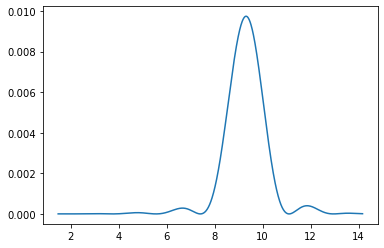

In [100]:
mags_LS = np.concatenate((mags.compressed(), mags.compressed(), mags.compressed(), mags.compressed(), mags.compressed()))
time_range = LC_time[-1] - LC_time[0]
time_LS = np.concatenate((LC_time, LC_time+time_range, LC_time+2*time_range, LC_time+3*time_range, LC_time+4*time_range))

freq1 = 1. / (LC_time[1] - LC_time[0])
freq2 = 1. / (LC_time[-1] - LC_time[0]) # difference b/w first and last time value

freqs = np.linspace(freq2, freq1, 1000)

lomb = lombscargle(time_LS, mags_LS, freqs, precenter=True)
plt.plot(freqs, lomb)



#### Finding coordinate bounds to use in catalogue searches:

In [90]:
if method == 'aperture':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um.pickle'
elif method == 'PSF':
    load_name_ch1 = 'phot_tables/IC4499/huge_table_'+method+'_3p6um_model_e'+str(model_epoch)+'.pickle'
    load_name_ch2 = 'phot_tables/IC4499/huge_table_'+method+'_4p5um_model_e'+str(model_epoch)+'.pickle'

pickle_in = open(load_name_ch1, 'rb')
huge_table_ch1 = pickle.load(pickle_in)
pickle_in = open(load_name_ch2, 'rb')
huge_table_ch2 = pickle.load(pickle_in)

maxRA = max(max(huge_table_ch1['RA']), max(huge_table_ch2['RA']))
minRA = min(min(huge_table_ch1['RA']), min(huge_table_ch2['RA']))
maxdec = max(max(huge_table_ch1['dec']), max(huge_table_ch2['dec']))
mindec = min(min(huge_table_ch1['dec']), min(huge_table_ch2['dec']))

cmax = SkyCoord(maxRA, maxdec, frame='icrs', unit='deg')
cmin = SkyCoord(minRA, mindec, frame='icrs', unit='deg')

print(cmax.ra.hour)
print(cmin.ra.hour)
print(cmax.dec.deg)
print(cmin.dec.deg)
print('')
print(cmax.ra.hms)
print(cmin.ra.hms)
print(cmax.dec.dms)
print(cmin.dec.dms)
print('')
print(cmax.ra.deg)
print(cmin.ra.deg)
print(cmax.dec.deg)
print(cmin.dec.deg)

15.27274781593681
15.262954120891306
0.062338251056566346
-0.28863006858262924

hms_tuple(h=15.0, m=16.0, s=21.89213737251748)
hms_tuple(h=15.0, m=15.0, s=46.63483520870315)
dms_tuple(d=0.0, m=3.0, s=44.41770380363885)
dms_tuple(d=-0.0, m=-17.0, s=-19.068246897465357)

229.0912172390521
228.94431181336955
0.062338251056566346
-0.28863006858262924


In [93]:
df_viz = pd.read_csv('data/reference/vizier_rrl_data_01.txt', sep=',', header=0)
df_viz.rename(columns={'_RAJ2000': 'RA', '_DEJ2000': 'dec'}, inplace=True)
df_viz['ID'] = np.arange(len(df_viz))
c_viz = SkyCoord(df_viz['RA'], df_viz['dec'], frame='icrs', unit='deg')
print(c_viz)

df_CC = pd.read_csv('data/reference/CVSGC_IC4499_readable.txt', sep=',', header=0)
c_CC = SkyCoord(df_CC['RA'], df_CC['dec'])
print(c_CC)

file1 = base_dir+'IC4499/IC4499_3p6um.fits'
file2 = base_dir+'IC4499/IC4499_4p5um.fits'

with fits.open(file1) as hdu_list:
    data1 = hdu_list[0].data
    hdr1 = hdu_list[0].header
    data1 *= hdr1['EXPTIME'] / hdr1['FLUXCONV']
with fits.open(file2) as hdu_list:
    data2 = hdu_list[0].data
    hdr2 = hdu_list[0].header
    data2 *= hdr2['EXPTIME'] / hdr2['FLUXCONV']
    
w1 = wcs.WCS(hdr1)
w2 = wcs.WCS(hdr2)

pixcoords1 = w1.world_to_pixel(c_viz)
pixcoords2 = w2.world_to_pixel(c_viz)
pixcoords3 = w1.world_to_pixel(c_CC)
pixcoords4 = w2.world_to_pixel(c_CC)

pos1 = np.transpose((pixcoords1[0].tolist(), pixcoords1[1].tolist()))
pos2 = np.transpose((pixcoords2[0].tolist(), pixcoords2[1].tolist()))
pos3 = np.transpose((pixcoords3[0].tolist(), pixcoords3[1].tolist()))
pos4 = np.transpose((pixcoords4[0].tolist(), pixcoords4[1].tolist()))

ap1 = CircularAperture(pos1, r=20.)
ap2 = CircularAperture(pos2, r=20.)
ap3 = CircularAperture(pos3, r=20.)
ap4 = CircularAperture(pos4, r=20.)

'''print('Vizier 3p6um:')
plotting(data1, ap1, an=None, cmap='Greys', choice='ap_only', savename=None)
print('CC 3p6um:')
plotting(data1, ap3, an=None, cmap='Greys', choice='ap_only', savename=None)
print('Vizier 4p5um:')
plotting(data2, ap2, an=None, cmap='Greys', choice='ap_only', savename=None)
print('CC 4p5um:')
plotting(data2, ap4, an=None, cmap='Greys', choice='ap_only', savename=None)'''



idx, d2d, d3d = c_CC.match_to_catalog_sky(c_viz)

max_sep = 1. * u.arcsec
selection = (d2d > max_sep)
match_index = idx
match_index[selection] = -1
ind = ((match_index >= 0))

t_CC = Table.from_pandas(df_CC)
t_viz = Table.from_pandas(df_viz)

t_CC = t_CC[ind]
t_viz = t_viz[match_index][ind]


#df_viz = df_viz[ind]
#df_CC = df_CC[match_index][ind]

print(pos1)
print(pos2)

<SkyCoord (ICRS): (ra, dec) in deg
    [(229.09705423, -0.1419235 ), (229.14462534, -0.07361858),
     (228.99634825, -0.08977613), (228.98840114, -0.11479928),
     (228.99266626, -0.09659805), (228.99144962, -0.18985356),
     (229.05318547, -0.16753341)]>
<SkyCoord (ICRS): (ra, dec) in deg
    [(228.98825   , -0.11480556), (228.99145833, -0.18983333),
     (229.05316667, -0.16758333), (229.024125  , -0.18686111),
     (228.992625  , -0.0965    )]>
[[1150.60170978 -158.82720255]
 [ 700.10161856 -374.39386995]
 [ 939.30062615  487.95755074]
 [1095.16247159  510.79307935]
 [ 983.25919901  503.15629139]
 [1536.63079122  420.09211581]
 [1344.70841214   76.14263545]]
[[ 468.47152004 -138.0380139 ]
 [  17.4007439  -352.41083815]
 [ 258.88648642  509.3046005 ]
 [ 414.8084007   531.72655577]
 [ 302.88525631  524.3866757 ]
 [ 856.03326346  439.85493128]
 [ 663.20023803   96.41633692]]


In [88]:
t_viz

RA,dec,LC,Source,Pf,P1O,EpG,EpBP,EpRP,Gmag,BPmag,RPmag,[Fe/H],ID
float64,float64,str2,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int32
228.98840114087997,-0.11479928258,LC,4418914863842345856,--,0.29322862,1709.84967006,1709.86409316,1709.86769057,17.3769,17.5206,17.0727,--,3
228.99144962264,-0.18985356481,LC,4418913218870688768,0.45604927,0.33245990000000003,1709.60130575,1709.61128542,1709.59236243,17.3686,17.5148,17.0328,--,5
229.05318546816002,-0.16753341272,LC,4418726027016125056,--,0.32994609999999996,1709.75584394,1709.75584394,1709.75584394,17.3467,--,--,--,6
228.99266625762002,-0.09659804838,LC,4418920808077110784,--,0.33793290000000004,1709.66035563,1709.70228387,1709.61788942,17.3395,17.5235,17.0014,--,4


In [89]:
t_CC

ID,RA,dec,units,period,mean_magnitude,amplitude,colour,type
int64,str12,str12,str2,float64,float64,float64,str1,str3
1,15h15m57.18s,-00d06m53.3s,R0,0.2932,17.71,0.42,B,RR1
2,15h15m57.95s,-00d11m23.4s,R0,0.3325,17.81,0.4,B,RR1
3,15h16m12.76s,-00d10m03.3s,R0,0.33,17.7,0.5,B,RR1
5,15h15m58.23s,-00d05m47.4s,R0,0.2524,17.7,0.3,B,RR1


     obs_time             phot          flux  flux_error
        d                 mag          s**-1    s**-1   
------------------ ------------------ ------- ----------
2456907.9906678265  17.29687752761975 2273.05    7.23073
 2456908.064654538  17.57060974933377 1766.51    10.9456
 2457019.150542085  17.37835270727514 2108.72    5.01939
2457019.2245546123 17.589951069589517 1735.32    3.93261
 2457037.655496694  17.49678601592281  1890.8    6.24171
2457037.7294821367 17.574902139517533 1759.54    13.0526
2457068.8913133885 17.200324347711295 2484.45    10.8324
2457068.9653275763  17.26746891645328 2335.46    8.27176
 2457212.528650488 17.479615499969483 1920.94    9.19921
 2457235.275109625 17.437318925423398 1997.25    11.0776
 2457265.686008323 17.163799572535435 2569.45    6.31324
 2457265.760009001 17.394197322117833 2078.17    9.92288
 2457393.522512756 17.150716104469854  2600.6    6.97652
2457393.6986845187 17.585424417575428 1742.57    16.7855
2457444.1896921983 17.376290002

Text(0.5, 1.0, 'RRL1')

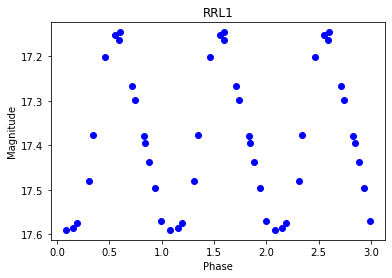

In [47]:
votable = parse('data/curves/proc_RRL1.vot')

table = votable.get_first_table()

print(table)

datavot = table.array
#print(datavot['obs_time'])

#Pvot_fund = 0.45604927
#Pvot_FO = 0.3324599
Pvot = 0.29322862

temp = [i / Pvot for i in datavot['obs_time']]
phasevot = temp - np.floor(temp)
print(phase)

magsvot = np.concatenate((datavot['phot'], datavot['phot'], datavot['phot']))
phasesvot = np.concatenate((phasevot, phasevot+1., phasevot+2.))

plt.plot(phasesvot, magsvot, 'bo')
#plt.plot(phasevot, datavot['obs_time'], 'bo')
plt.xlabel('Phase')
plt.ylabel('Magnitude')
plt.gca().invert_yaxis()
#plt.title('RRL2 using fundamental period')
#plt.title('RRL2 using first overtone period')
plt.title('RRL1')